In [2]:
from sklearn.metrics import mean_squared_error

In [3]:
import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input


In [4]:
from sklearn.utils.multiclass  import unique_labels
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# Define a function to evaluate the performance of a classification model using various metrics and visualizations.
def evaluate_metrics(y_pred, y_test):
    # Obtain and print unique labels from y_test and y_pred.
    labels = unique_labels(y_test, y_pred)
    # Generate and print a classification report showing precision, recall, F1-score, and support for each class.
    report = classification_report(y_test, y_pred, target_names=labels)
    print(report)
    # Add spacing for clarity.
    print( "\n"*5)
    # Generate and display a confusion matrix.
    cm = confusion_matrix(y_test, y_pred, labels=labels)
    cm_display = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    plt.figure(figsize=(8, 6))
    cm_display.plot()
    plt.title('Confusion Matrix')
    plt.show()

In [5]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
file_path = '/content/drive/MyDrive/ProgettoDataMining/complete_df.pkl'

# Salva il DataFrame come file pickle
df = pd.read_pickle(file_path)

In [7]:

size = (224, 224)
df["Preprocessed_vgg16"] = None

# Iterating over all rows in the DataFrame
for i in range(len(df)):
    # Load the grayscale image from the DataFrame
    gray_image = df.at[i, "Image"].astype(np.uint8)

    # Resize the grayscale image
    resized_image = cv2.resize(gray_image, size)


    # Convert the resized image to RGB
    rgb_image = cv2.cvtColor(resized_image, cv2.COLOR_GRAY2RGB)
    preprocessed_image = preprocess_input(rgb_image)

    # Update the image in the DataFrame
    df.at[i, "Image"] = rgb_image
    df.at[i, "Preprocessed_vgg16"] = preprocessed_image


In [8]:
df_glioma = df[df['Label'] == 'glioma']
df_notumor = df[df['Label'] == 'notumor']
df_pituitary_tumor = df[df['Label'] == 'pituitary tumor']
df_meningioma = df[df['Label'] == 'meningioma']

In [9]:
from tensorflow.keras.models import load_model, save_model

In [10]:
del df

In [11]:


from tensorflow.keras.layers import  Layer
import tensorflow as tf



from tensorflow.keras.layers import Input, Flatten, Dense, Reshape
from tensorflow.keras.models import Model


from sklearn.model_selection import train_test_split

In [12]:
from tensorflow.keras.utils import plot_model

In [13]:
from tensorflow.keras.optimizers import Adam

##Create the model

In [14]:

# Definizione dell'input
input_img = Input(shape=(224, 224, 3))

# Flatten dell'input
x = Flatten()(input_img)
x = Dense(512, activation='relu')(x)
x = Dense(256, activation='relu')(x)
x = Dense(128, activation='relu')(x)

# Codifica in un vettore latente di dimensione 64
latent = Dense(64, activation='relu')(x)

# Altro strato densamente connesso
x = Dense(128, activation='relu')(latent)
x = Dense(256, activation='relu')(x)
x = Dense(512, activation='relu')(x)

# Reshape per ottenere l'immagine ricostruita
decoded = Dense(224*224*3, activation='sigmoid')(x)
decoded = Reshape((224, 224, 3))(decoded)

# Modello completo
autoencoder = Model(input_img, decoded)

In [15]:
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 flatten (Flatten)           (None, 150528)            0         
                                                                 
 dense (Dense)               (None, 512)               77070848  
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dense_3 (Dense)             (None, 64)                8256      
                                                                 
 dense_4 (Dense)             (None, 128)               8320  

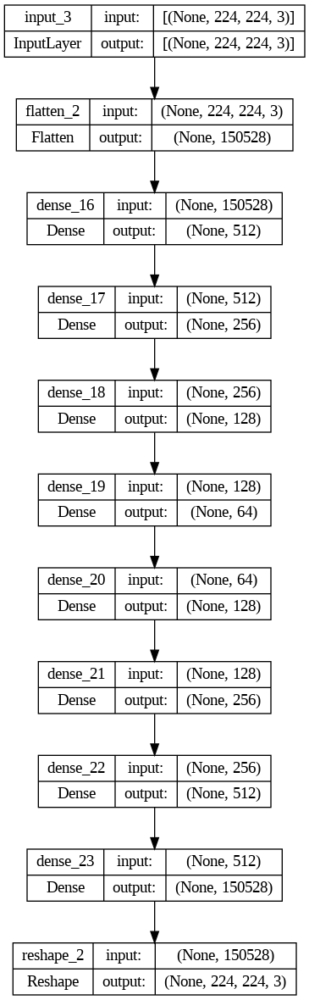

In [68]:
plot_model(autoencoder, to_file='model_plot.png', show_shapes=True, show_layer_names=True)

#Outlier detection notumor

##Create the train and test set for notumor

In [16]:
X = []

# Iterate through the values in the "Preprocessed_vgg16" column.
for i,x in enumerate(df_notumor["Image"].values):
    x = x/255
    # Reshape each image to the required input shape for the VGG16 model.
    new = x.reshape(1, 224, 224, 3)

    # Add the reshaped image to the list.
    X.append(new)

X = np.vstack(X)
X= X.astype(np.float16)

In [17]:

X_train_notumor, X_test_notumor = train_test_split(X, test_size=0.2, random_state=42)

##Train

In [18]:
del X

In [19]:
autoencoder.compile(optimizer=Adam(learning_rate=0.0005), loss='mse') # 0,0001

In [20]:
history = autoencoder.fit(X_train_notumor,X_train_notumor,
                          epochs=50,
                          batch_size=32,
                          shuffle=True,
                          validation_split=0.2)

Epoch 1/50
30/30 [==============================] - 8s 92ms/step - loss: 0.0672 - val_loss: 0.0461
Epoch 2/50
30/30 [==============================] - 2s 76ms/step - loss: 0.0437 - val_loss: 0.0434
Epoch 3/50
30/30 [==============================] - 3s 90ms/step - loss: 0.0411 - val_loss: 0.0402
Epoch 4/50
30/30 [==============================] - 2s 67ms/step - loss: 0.0394 - val_loss: 0.0388
Epoch 5/50
30/30 [==============================] - 2s 67ms/step - loss: 0.0382 - val_loss: 0.0381
Epoch 6/50
30/30 [==============================] - 2s 68ms/step - loss: 0.0371 - val_loss: 0.0377
Epoch 7/50
30/30 [==============================] - 2s 68ms/step - loss: 0.0363 - val_loss: 0.0370
Epoch 8/50
30/30 [==============================] - 2s 74ms/step - loss: 0.0353 - val_loss: 0.0351
Epoch 9/50
30/30 [==============================] - 3s 90ms/step - loss: 0.0338 - val_loss: 0.0350
Epoch 10/50
30/30 [==============================] - 2s 70ms/step - loss: 0.0327 - val_loss: 0.0335
Epoch 11/

In [21]:
# to clean the cpu

import gc
gc.collect()

2209

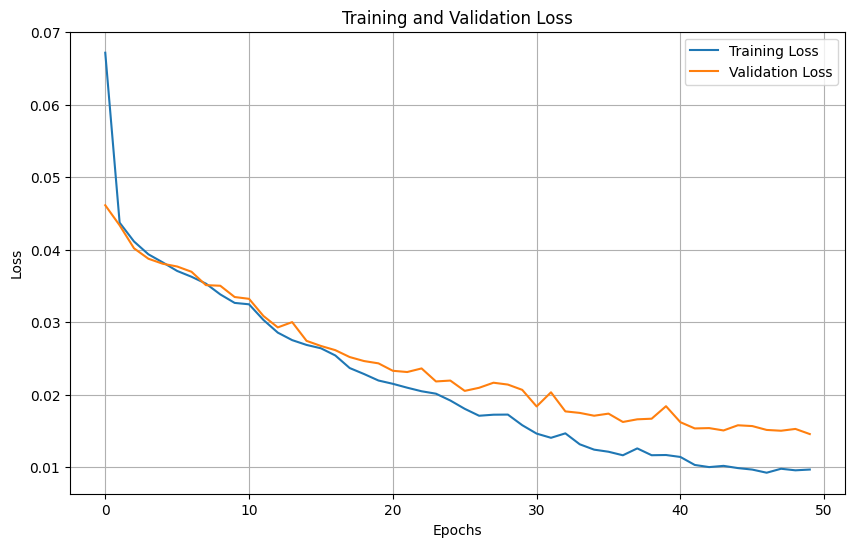

In [22]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
""" autoencoder.save('/content/drive/MyDrive/ProgettoDataMining/autoencoder_notumor.keras') """

##  Show the result for notumor

In [ ]:
## one time that the model is been trained you just load the model
autoencoder = tf.keras.models.load_model('/content/drive/MyDrive/ProgettoDataMining/autoencoder_notumor.keras')

### External Validation

#####SImulation of the outlier for notumor

In [23]:
import random

### 240 for validation and 300 for test
n = 540

simulation = []

for i in range(n):

  random.seed(i)
  df = random.choice([df_meningioma, df_glioma, df_pituitary_tumor])
  sample = df.sample(n=1, random_state=i)
  sample = (sample.iloc[0,0])/255
  simulation.append(sample)



In [24]:
X_val_outlier_notumor = simulation[:240]
X_test_outlier_notumor = simulation[240:]

In [25]:
X_val_notumor = X_train_notumor[960:1200]
#X_test_notumor are always the same

####Classifer and thereshold validation

if after the  autoencoder prediction the mse result is bigger than a thereshols , then that image is an outlier

##### visualization for an  idea of  the range of theresholds

In [26]:
mse_simulation_validation_notumor = []

for i  in range(len(X_val_outlier_notumor)):
  print(i)
  observation = X_val_outlier_notumor[i]
  processed_sample = observation.reshape(1,224,224,3)
  pred = autoencoder.predict(processed_sample)
  mse = mean_squared_error(pred.flatten(), observation.flatten())
  mse_simulation_validation_notumor.append(mse)



mse_tot_validation_notumor = []

for i in range(len(X_val_notumor)):
   print(i)
   real = X_val_notumor[i]
   preprocessed_real= real.reshape(1,224,224,3)
   pred = autoencoder.predict(preprocessed_real)
   mse = mean_squared_error(pred.flatten(), real.flatten())
   mse_tot_validation_notumor.append(mse)






0
1/1 [==============================] - 0s 239ms/step
1
1/1 [==============================] - 0s 34ms/step
2
1/1 [==============================] - 0s 39ms/step
3
1/1 [==============================] - 0s 34ms/step
4
1/1 [==============================] - 0s 34ms/step
5
1/1 [==============================] - 0s 70ms/step
6
1/1 [==============================] - 0s 99ms/step
7
1/1 [==============================] - 0s 44ms/step
8
1/1 [==============================] - 0s 74ms/step
9
1/1 [==============================] - 0s 82ms/step
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 33ms/step
12
1/1 [==============================] - 0s 64ms/step
13
1/1 [==============================] - 0s 75ms/step
14
1/1 [==============================] - 0s 54ms/step
15
1/1 [==============================] - 0s 41ms/step
16
1/1 [==============================] - 0s 37ms/step
17
1/1 [==============================] - 0s 29ms/step
18
1/1 [===========

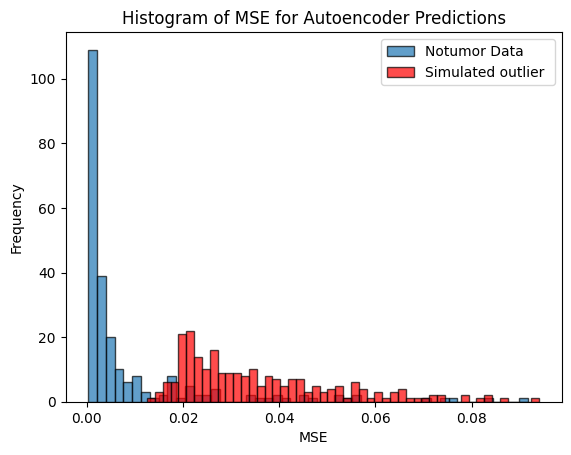

In [ ]:
import matplotlib.pyplot as plt

# Istogramma 1 (mse_tot_test)
plt.hist(mse_tot_validation_notumor, bins=50, edgecolor='k', alpha=0.7, label='Notumor Data')

# Istogramma 2 (mse_simulation)
plt.hist(mse_simulation_validation_notumor, bins=50, edgecolor='k', color='red', alpha=0.7, label='Simulated outlier ')

# Etichette e titolo
plt.xlabel('MSE')
plt.ylabel('Frequency')
plt.title('Histogram of MSE for Autoencoder Predictions')

# Mostra la legenda
plt.legend()

# Mostra il plot
plt.show()

##### Validation for thereshold[testo del link](https://)

In [ ]:
## ground_truth
list1 = ["notumor" for _ in range(len(mse_tot_validation_notumor))]
list2 = ["outlier" for _ in range(len(mse_simulation_validation_notumor))]

y_validation = list1 + list2


For this thereshold value 0.01 the confusion matrix is 




              precision    recall  f1-score   support

     notumor       1.00      0.78      0.88       240
     outlier       0.82      1.00      0.90       240

    accuracy                           0.89       480
   macro avg       0.91      0.89      0.89       480
weighted avg       0.91      0.89      0.89       480









<Figure size 800x600 with 0 Axes>

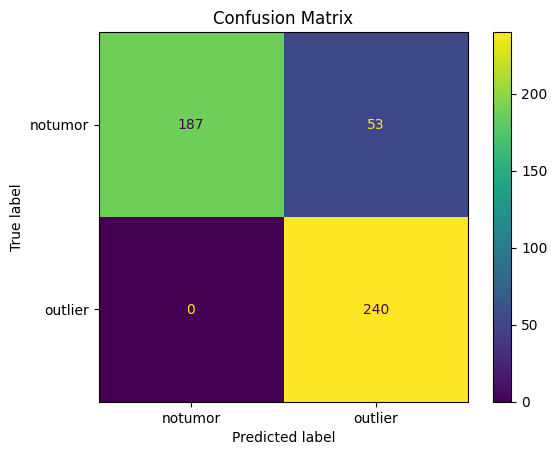












For this thereshold value 0.011666666666666667 the confusion matrix is 




              precision    recall  f1-score   support

     notumor       1.00      0.80      0.89       240
     outlier       0.84      1.00      0.91       240

    accuracy                           0.90       480
   macro avg       0.92      0.90      0.90       480
weighted avg       0.92      0.90      0.90       480









<Figure size 800x600 with 0 Axes>

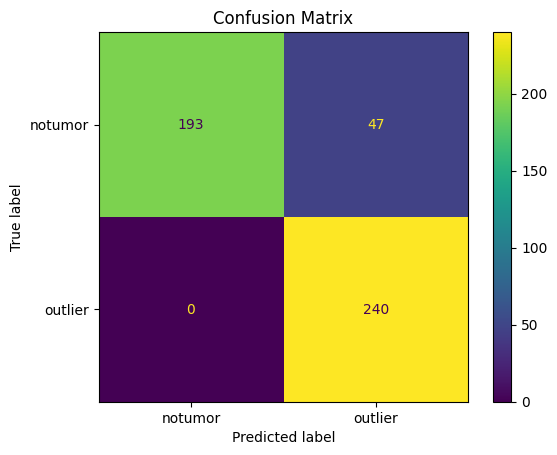












For this thereshold value 0.013333333333333334 the confusion matrix is 




              precision    recall  f1-score   support

     notumor       0.99      0.82      0.90       240
     outlier       0.84      1.00      0.91       240

    accuracy                           0.91       480
   macro avg       0.92      0.91      0.91       480
weighted avg       0.92      0.91      0.91       480









<Figure size 800x600 with 0 Axes>

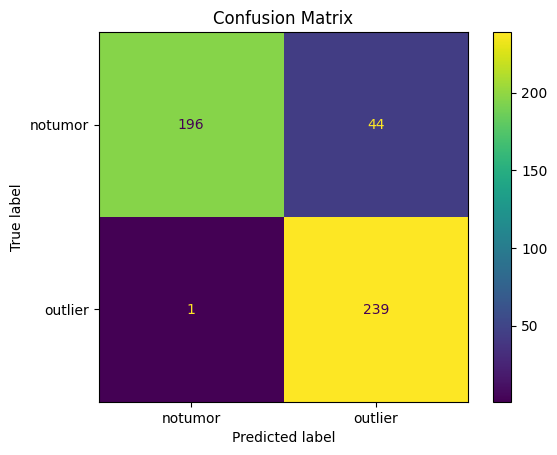












For this thereshold value 0.015 the confusion matrix is 




              precision    recall  f1-score   support

     notumor       0.98      0.82      0.89       240
     outlier       0.84      0.99      0.91       240

    accuracy                           0.90       480
   macro avg       0.91      0.90      0.90       480
weighted avg       0.91      0.90      0.90       480









<Figure size 800x600 with 0 Axes>

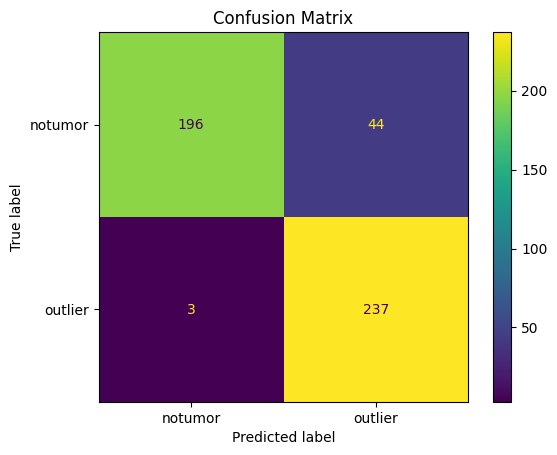












For this thereshold value 0.016666666666666666 the confusion matrix is 




              precision    recall  f1-score   support

     notumor       0.97      0.82      0.89       240
     outlier       0.85      0.97      0.90       240

    accuracy                           0.90       480
   macro avg       0.91      0.90      0.90       480
weighted avg       0.91      0.90      0.90       480









<Figure size 800x600 with 0 Axes>

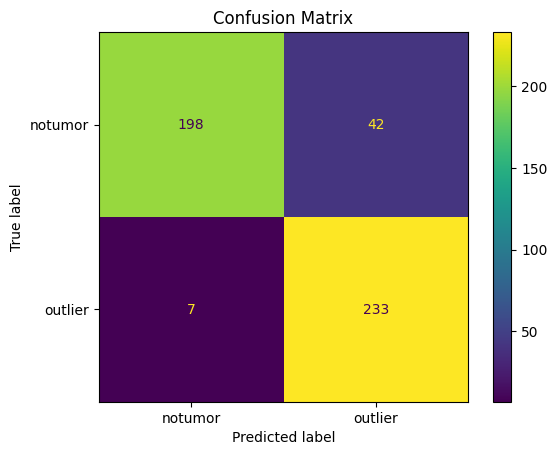












For this thereshold value 0.018333333333333333 the confusion matrix is 




              precision    recall  f1-score   support

     notumor       0.94      0.85      0.89       240
     outlier       0.87      0.94      0.90       240

    accuracy                           0.90       480
   macro avg       0.90      0.90      0.90       480
weighted avg       0.90      0.90      0.90       480









<Figure size 800x600 with 0 Axes>

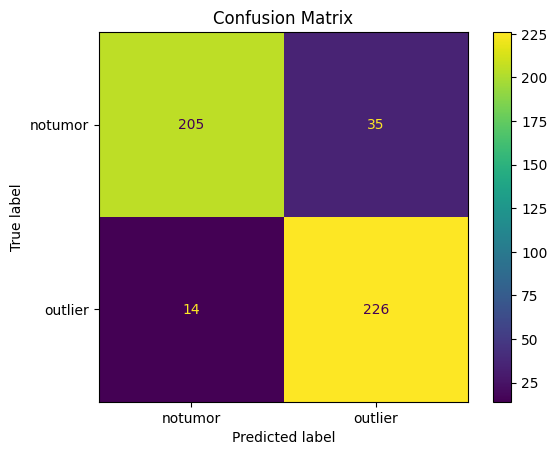












For this thereshold value 0.02 the confusion matrix is 




              precision    recall  f1-score   support

     notumor       0.89      0.86      0.87       240
     outlier       0.86      0.90      0.88       240

    accuracy                           0.88       480
   macro avg       0.88      0.88      0.88       480
weighted avg       0.88      0.88      0.88       480









<Figure size 800x600 with 0 Axes>

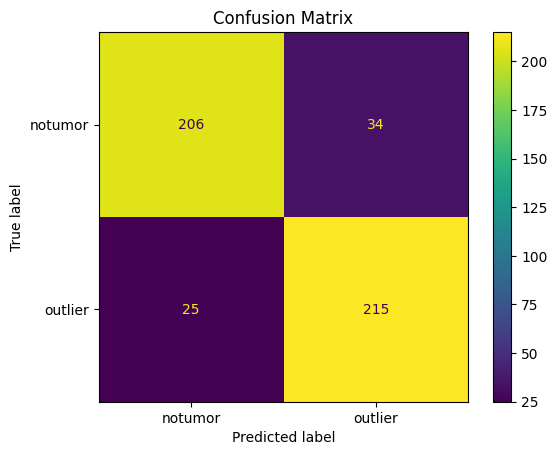












For this thereshold value 0.021666666666666667 the confusion matrix is 




              precision    recall  f1-score   support

     notumor       0.81      0.88      0.84       240
     outlier       0.87      0.80      0.83       240

    accuracy                           0.84       480
   macro avg       0.84      0.84      0.84       480
weighted avg       0.84      0.84      0.84       480









<Figure size 800x600 with 0 Axes>

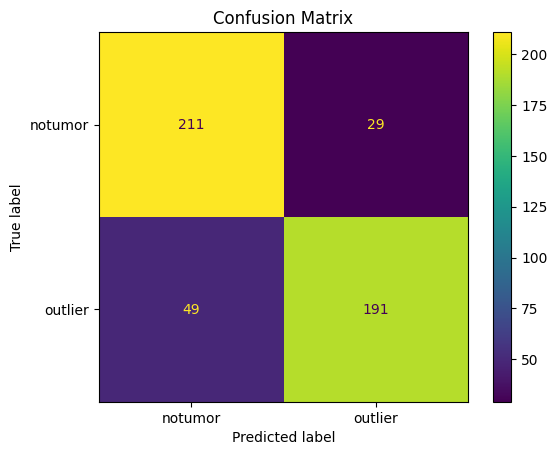












For this thereshold value 0.023333333333333334 the confusion matrix is 




              precision    recall  f1-score   support

     notumor       0.75      0.89      0.82       240
     outlier       0.87      0.71      0.78       240

    accuracy                           0.80       480
   macro avg       0.81      0.80      0.80       480
weighted avg       0.81      0.80      0.80       480









<Figure size 800x600 with 0 Axes>

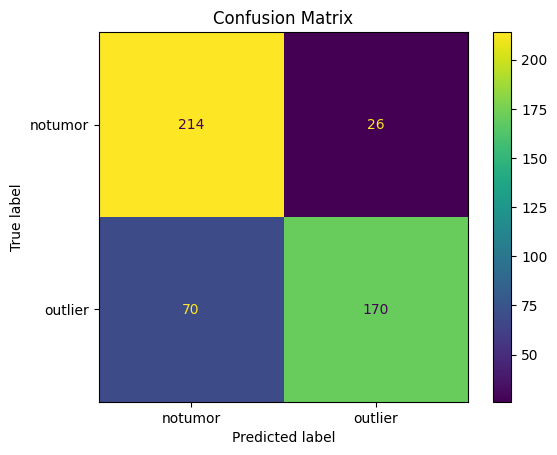












For this thereshold value 0.025 the confusion matrix is 




              precision    recall  f1-score   support

     notumor       0.74      0.90      0.81       240
     outlier       0.87      0.68      0.76       240

    accuracy                           0.79       480
   macro avg       0.80      0.79      0.78       480
weighted avg       0.80      0.79      0.78       480









<Figure size 800x600 with 0 Axes>

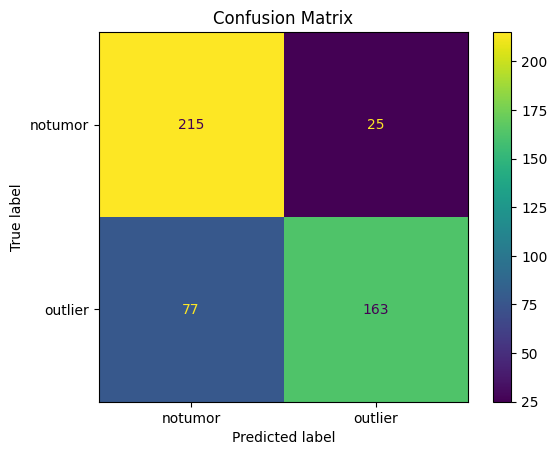

In [ ]:
# Range of thereshokds
thresholds = np.linspace(0.010, 0.025, 10)



print()

# Iteration on theresholds
for threshold in thresholds:

    print("For this thereshold value",threshold, "the confusion matrix is ")
    print("\n"*3)
    preds_1 = []
    preds_2 = []

    # Iteration_tot_validation_notumor
    for error in mse_tot_validation_notumor:
        if error < threshold:
            pred = "notumor"
        else:
            pred = "outlier"
        preds_1.append(pred)

    # Iteration on  mse_simulation_validation_notumor
    for error in mse_simulation_validation_notumor:
        if error < threshold:
            pred = "notumor"
        else:
            pred = "outlier"
        preds_2.append(pred)

    # Unione delle predizioni
    y_pred_validation = preds_1 + preds_2

    # Evaluation of metric
    evaluate_metrics(y_pred_validation, y_validation)

    print("\n"*10)

selected thereshold = 0.013

##### Test the complete classifier

In [ ]:
mse_simulation_test_notumor = []

for i  in range(len(X_test_outlier_notumor)):


  print(i)
  observation = X_test_outlier_notumor[i]
  processed_sample = observation.reshape(1,224,224,3)
  pred = autoencoder.predict(processed_sample)
  mse = mean_squared_error(pred.flatten(), observation.flatten())
  mse_simulation_test_notumor.append(mse)



mse_tot_test_notumor = []

for i in range(len(X_test_notumor)):
   print(i)
   real = X_test_notumor[i]
   preprocessed_real = real.reshape(1,224,224,3)
   pred = autoencoder.predict(preprocessed_real)
   mse = mean_squared_error(pred.flatten(), real.flatten())
   mse_tot_test_notumor.append(mse)


0
1/1 [==============================] - 0s 139ms/step
1
1/1 [==============================] - 0s 93ms/step
2
1/1 [==============================] - 0s 95ms/step
3
1/1 [==============================] - 0s 91ms/step
4
1/1 [==============================] - 0s 89ms/step
5
1/1 [==============================] - 0s 89ms/step
6
1/1 [==============================] - 0s 125ms/step
7
1/1 [==============================] - 0s 119ms/step
8
1/1 [==============================] - 0s 129ms/step
9
1/1 [==============================] - 0s 124ms/step
10
1/1 [==============================] - 0s 121ms/step
11
1/1 [==============================] - 0s 116ms/step
12
1/1 [==============================] - 0s 160ms/step
13
1/1 [==============================] - 0s 146ms/step
14
1/1 [==============================] - 0s 175ms/step
15
1/1 [==============================] - 0s 153ms/step
16
1/1 [==============================] - 0s 173ms/step
17
1/1 [==============================] - 0s 166ms/step
18
1/1 

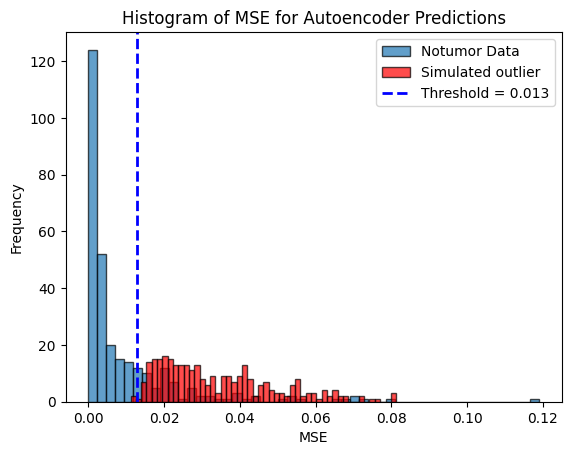

In [ ]:
# Istogramma 1 (mse_tot_test)
plt.hist(mse_tot_test_notumor, bins=50, edgecolor='k', alpha=0.7, label='Notumor Data')

# Istogramma 2 (mse_simulation)
plt.hist(mse_simulation_test_notumor, bins=50, edgecolor='k', color='red', alpha=0.7, label='Simulated outlier ')

# Etichette e titolo
plt.xlabel('MSE')
plt.ylabel('Frequency')
plt.title('Histogram of MSE for Autoencoder Predictions')


threshold = 0.013
plt.axvline(threshold, color='blue', linestyle='--', linewidth=2, label=f'Threshold = {threshold}')


# Mostra la legenda
plt.legend()

# Mostra il plot
plt.show()

In [ ]:
## ground_truth
list1 = ["notumor" for _ in range(len(mse_tot_test_notumor))]
list2 = ["outlier" for _ in range(len(mse_simulation_test_notumor))]

y_test = list1 + list2

NameError: name 'mse_tot_test_notumor' is not defined

              precision    recall  f1-score   support

     notumor       0.99      0.78      0.87       300
     outlier       0.82      0.99      0.90       300

    accuracy                           0.89       600
   macro avg       0.90      0.89      0.88       600
weighted avg       0.90      0.89      0.88       600









<Figure size 800x600 with 0 Axes>

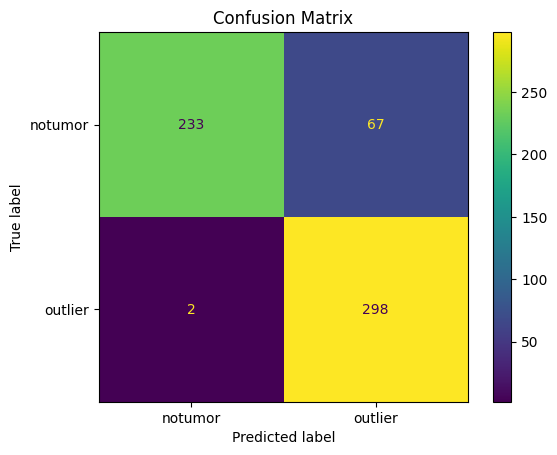

In [ ]:
preds_1 = []
preds_2 = []

# Iteration_tot_validation_notumor
for error in mse_tot_test_notumor:
    if error < threshold:
        pred = "notumor"
    else:
        pred = "outlier"
    preds_1.append(pred)

# Iteration on  mse_simulation_validation_notumor
for error in mse_simulation_test_notumor:
    if error < threshold:
        pred = "notumor"
    else:
        pred = "outlier"
    preds_2.append(pred)

# Unione delle predizioni
y_pred_test = preds_1 + preds_2

# Evaluation of metric
evaluate_metrics(y_pred_test, y_test)

high recall is good if one want to work in a conservative way

#####Showing the original image and reconstructed image

####### on the trained class

1/1 [==============================] - 0s 258ms/step


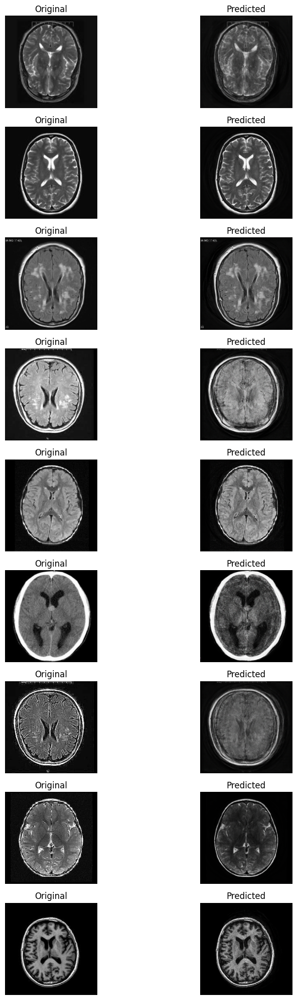

In [ ]:
plt.figure(figsize=(10, 20))

# Displaying 9 images in a 2x9 grid (2 columns, 9 rows)
for i in range(9):
    # Original image
    plt.subplot(9, 2, 2 * i + 1)
    real = X_test_notumor[i].astype(np.float32)
    plt.imshow(real)
    plt.title('Original')
    plt.axis('off')

    # Predicted image
    plt.subplot(9, 2, 2 * i + 2)
    z = real.reshape(1, 224, 224, 3)
    k = autoencoder.predict(z)
    k_new = k[0, :, :, :]
    plt.imshow(k_new)
    plt.title('Predicted')
    plt.axis('off')

plt.tight_layout()
plt.show()

#######on the outlier class

1/1 [==============================] - 0s 125ms/step


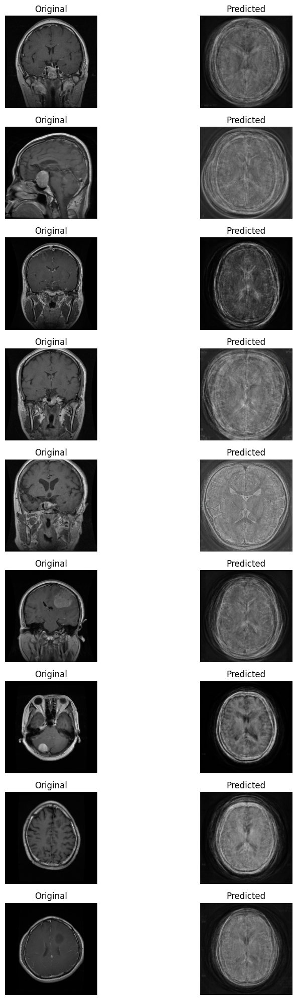

In [ ]:
plt.figure(figsize=(10, 20))

# Displaying 9 images in a 2x9 grid (2 columns, 9 rows)
for i in range(9):
    # Original image
    plt.subplot(9, 2, 2 * i + 1)
    real = X_test_outlier_notumor[i].astype(np.float32)
    plt.imshow(real)
    plt.title('Original')
    plt.axis('off')

    # Predicted image
    plt.subplot(9, 2, 2 * i + 2)
    z = real.reshape(1, 224, 224, 3)
    k = autoencoder.predict(z)
    k_new = k[0, :, :, :]
    plt.imshow(k_new)
    plt.title('Predicted')
    plt.axis('off')

plt.tight_layout()
plt.show()

it is goood because there are bad prediction  for outliers

#Outlier Detection Glioma

##Create the train and test set for glioma

In [16]:
X = []

# Iterate through the values in the "Preprocessed_vgg16" column.
for i,x in enumerate(df_glioma["Image"].values):
    x = x/255
    # Reshape each image to the required input shape for the VGG16 model.
    new = x.reshape(1, 224, 224, 3)

    # Add the reshaped image to the list.
    X.append(new)

X = np.vstack(X)
X= X.astype(np.float16)

In [17]:
X_train_glioma, X_test_glioma = train_test_split(X, test_size=0.2, random_state=42)

In [18]:
X_train_glioma.shape

(1140, 224, 224, 3)

##Train

In [19]:
del X

In [20]:
autoencoder.compile(optimizer=Adam(learning_rate=0.0005), loss='mse')

In [21]:
history = autoencoder.fit(X_train_glioma,X_train_glioma,
                          epochs=50,
                          batch_size=32,
                          shuffle=True,
                          validation_split=0.2)

Epoch 1/50
29/29 [==============================] - 8s 88ms/step - loss: 0.0619 - val_loss: 0.0217
Epoch 2/50
29/29 [==============================] - 2s 69ms/step - loss: 0.0172 - val_loss: 0.0145
Epoch 3/50
29/29 [==============================] - 2s 69ms/step - loss: 0.0145 - val_loss: 0.0134
Epoch 4/50
29/29 [==============================] - 2s 68ms/step - loss: 0.0135 - val_loss: 0.0130
Epoch 5/50
29/29 [==============================] - 2s 76ms/step - loss: 0.0133 - val_loss: 0.0132
Epoch 6/50
29/29 [==============================] - 2s 74ms/step - loss: 0.0130 - val_loss: 0.0137
Epoch 7/50
29/29 [==============================] - 2s 72ms/step - loss: 0.0127 - val_loss: 0.0123
Epoch 8/50
29/29 [==============================] - 2s 67ms/step - loss: 0.0121 - val_loss: 0.0119
Epoch 9/50
29/29 [==============================] - 2s 68ms/step - loss: 0.0116 - val_loss: 0.0116
Epoch 10/50
29/29 [==============================] - 2s 67ms/step - loss: 0.0114 - val_loss: 0.0118
Epoch 11/

In [22]:
# to clean the cpu

import gc
gc.collect()

1357

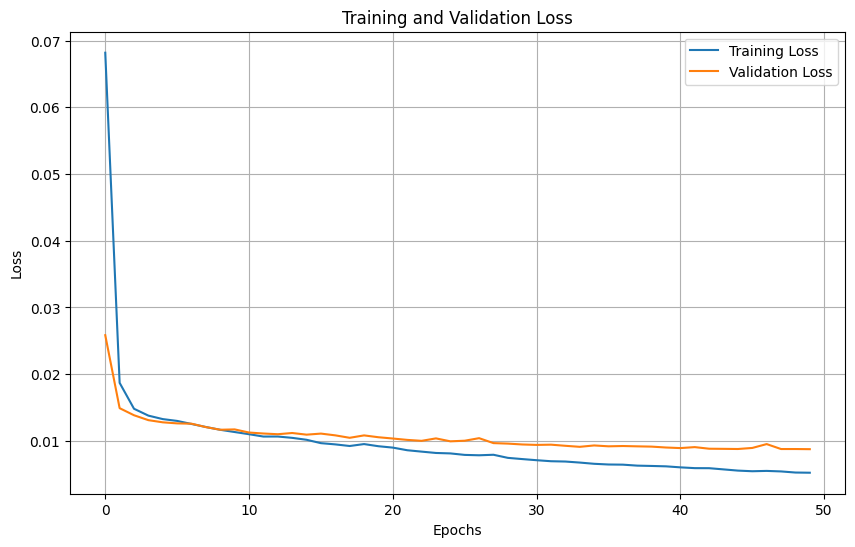

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
"""autoencoder.save('/content/drive/MyDrive/ProgettoDataMining/autoencoder_glioma.keras') """

##  Show the result for glioma

In [27]:
## one time that the model is been trained you just load the model
autoencoder = tf.keras.models.load_model('/content/drive/MyDrive/ProgettoDataMining/autoencoder_glioma.keras')

### External Validation

#####SImulation of the outlier for glioma

In [34]:
len(X_train_glioma)

1140

In [35]:
len(X_test_glioma)

286

In [38]:
import random

### 228 for validation and 286 for test
n = 514

simulation = []

for i in range(n):

  random.seed(i)
  df = random.choice([df_meningioma, df_notumor, df_pituitary_tumor])
  sample = df.sample(n=1, random_state=i)
  sample = (sample.iloc[0,0])/255
  simulation.append(sample)

In [39]:
X_val_outlier_glioma = simulation[:228]
X_test_outlier_glioma = simulation[228:]

In [40]:
X_val_glioma = X_train_glioma[972:1200]

####Classifer and thereshold validation

In [41]:
mse_simulation_validation_glioma = []

for i  in range(len(X_val_outlier_glioma)):
  print(i)
  observation = X_val_outlier_glioma[i]
  processed_sample = observation.reshape(1,224,224,3)
  pred = autoencoder.predict(processed_sample)
  mse = mean_squared_error(pred.flatten(), observation.flatten())
  mse_simulation_validation_glioma.append(mse)



mse_tot_validation_glioma = []

for i in range(len(X_val_glioma)):
   print(i)
   real = X_val_glioma[i]
   preprocessed_real= real.reshape(1,224,224,3)
   pred = autoencoder.predict(preprocessed_real)
   mse = mean_squared_error(pred.flatten(), real.flatten())
   mse_tot_validation_glioma.append(mse)


0
1/1 [==============================] - 0s 167ms/step
1
1/1 [==============================] - 0s 20ms/step
2
1/1 [==============================] - 0s 31ms/step
3
1/1 [==============================] - 0s 53ms/step
4
1/1 [==============================] - 0s 23ms/step
5
1/1 [==============================] - 0s 26ms/step
6
1/1 [==============================] - 0s 22ms/step
7
1/1 [==============================] - 0s 23ms/step
8
1/1 [==============================] - 0s 38ms/step
9
1/1 [==============================] - 0s 19ms/step
10
1/1 [==============================] - 0s 20ms/step
11
1/1 [==============================] - 0s 20ms/step
12
1/1 [==============================] - 0s 22ms/step
13
1/1 [==============================] - 0s 20ms/step
14
1/1 [==============================] - 0s 23ms/step
15
1/1 [==============================] - 0s 22ms/step
16
1/1 [==============================] - 0s 21ms/step
17
1/1 [==============================] - 0s 22ms/step
18
1/1 [===========

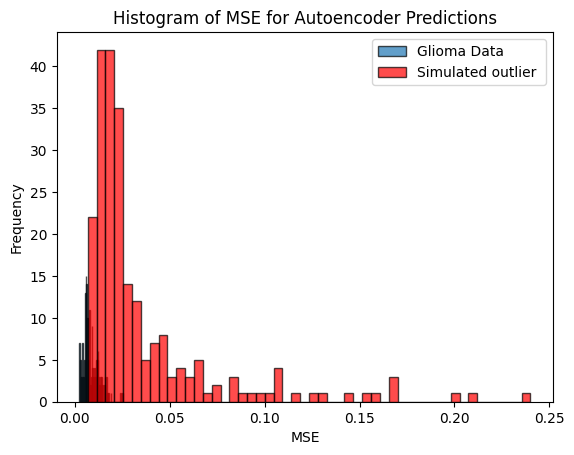

In [42]:
import matplotlib.pyplot as plt

# Istogramma 1 (mse_tot_test)
plt.hist(mse_tot_validation_glioma, bins=50, edgecolor='k', alpha=0.7, label='Glioma Data')

# Istogramma 2 (mse_simulation)
plt.hist(mse_simulation_validation_glioma, bins=50, edgecolor='k', color='red', alpha=0.7, label='Simulated outlier ')

# Etichette e titolo
plt.xlabel('MSE')
plt.ylabel('Frequency')
plt.title('Histogram of MSE for Autoencoder Predictions')

# Mostra la legenda
plt.legend()

# Mostra il plot
plt.show()

##### Validation for thereshold

In [43]:
## ground_truth
list1 = ["glioma" for _ in range(len(mse_tot_validation_glioma))]
list2 = ["outlier" for _ in range(len(mse_simulation_validation_glioma))]

y_validation = list1 + list2


For this thereshold value 0.001 the confusion matrix is 




              precision    recall  f1-score   support

      glioma       0.00      0.00      0.00       168
     outlier       0.58      1.00      0.73       228

    accuracy                           0.58       396
   macro avg       0.29      0.50      0.37       396
weighted avg       0.33      0.58      0.42       396









/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


<Figure size 800x600 with 0 Axes>

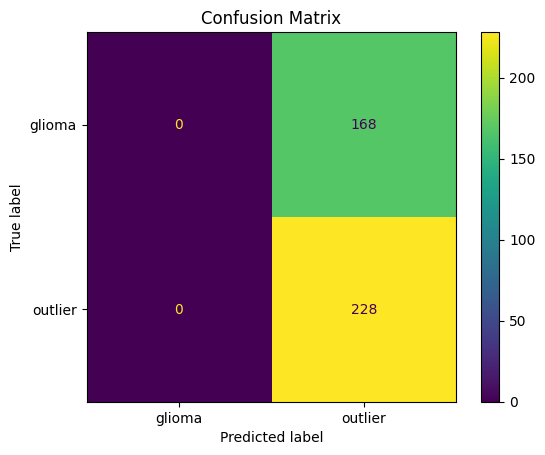












For this thereshold value 0.0036666666666666666 the confusion matrix is 




              precision    recall  f1-score   support

      glioma       1.00      0.08      0.15       168
     outlier       0.60      1.00      0.75       228

    accuracy                           0.61       396
   macro avg       0.80      0.54      0.45       396
weighted avg       0.77      0.61      0.50       396









<Figure size 800x600 with 0 Axes>

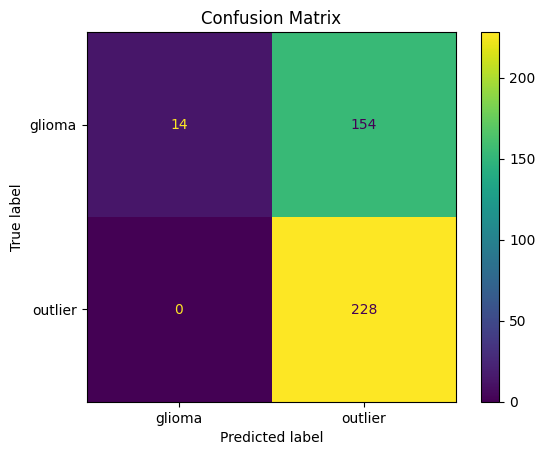












For this thereshold value 0.006333333333333333 the confusion matrix is 




              precision    recall  f1-score   support

      glioma       1.00      0.39      0.56       168
     outlier       0.69      1.00      0.82       228

    accuracy                           0.74       396
   macro avg       0.84      0.69      0.69       396
weighted avg       0.82      0.74      0.71       396









<Figure size 800x600 with 0 Axes>

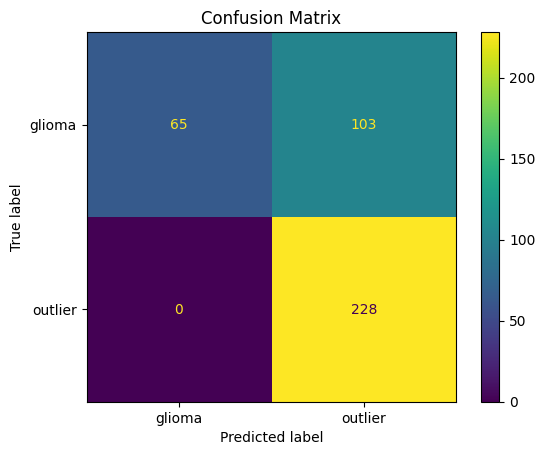












For this thereshold value 0.009000000000000001 the confusion matrix is 




              precision    recall  f1-score   support

      glioma       0.92      0.62      0.74       168
     outlier       0.78      0.96      0.86       228

    accuracy                           0.82       396
   macro avg       0.85      0.79      0.80       396
weighted avg       0.84      0.82      0.81       396









<Figure size 800x600 with 0 Axes>

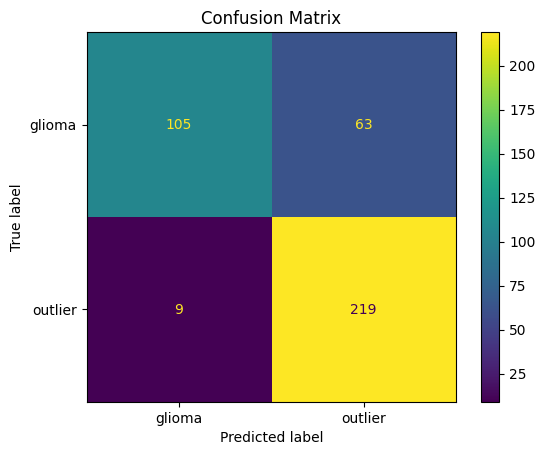












For this thereshold value 0.011666666666666665 the confusion matrix is 




              precision    recall  f1-score   support

      glioma       0.85      0.79      0.81       168
     outlier       0.85      0.89      0.87       228

    accuracy                           0.85       396
   macro avg       0.85      0.84      0.84       396
weighted avg       0.85      0.85      0.85       396









<Figure size 800x600 with 0 Axes>

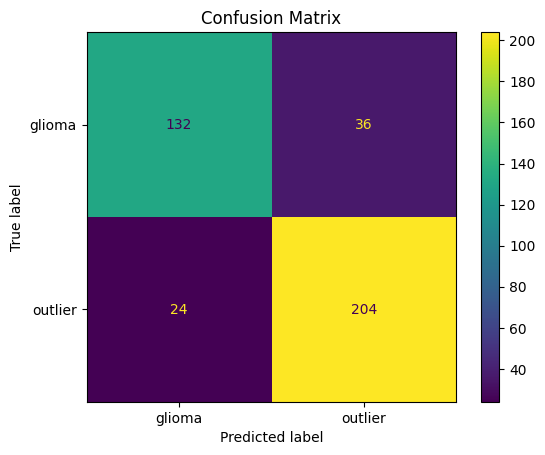












For this thereshold value 0.014333333333333333 the confusion matrix is 




              precision    recall  f1-score   support

      glioma       0.78      0.91      0.84       168
     outlier       0.92      0.81      0.86       228

    accuracy                           0.85       396
   macro avg       0.85      0.86      0.85       396
weighted avg       0.86      0.85      0.85       396









<Figure size 800x600 with 0 Axes>

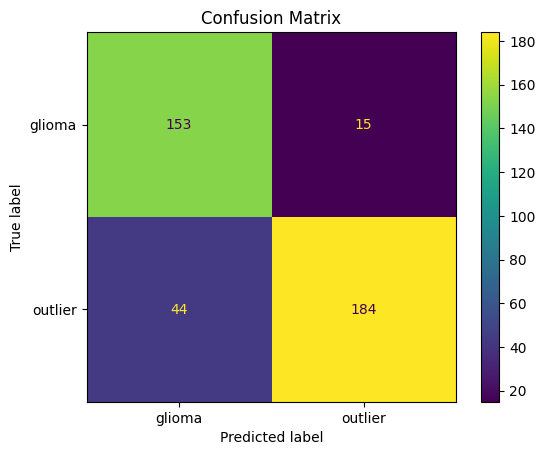












For this thereshold value 0.017 the confusion matrix is 




              precision    recall  f1-score   support

      glioma       0.69      0.97      0.81       168
     outlier       0.97      0.68      0.80       228

    accuracy                           0.80       396
   macro avg       0.83      0.83      0.80       396
weighted avg       0.85      0.80      0.80       396









<Figure size 800x600 with 0 Axes>

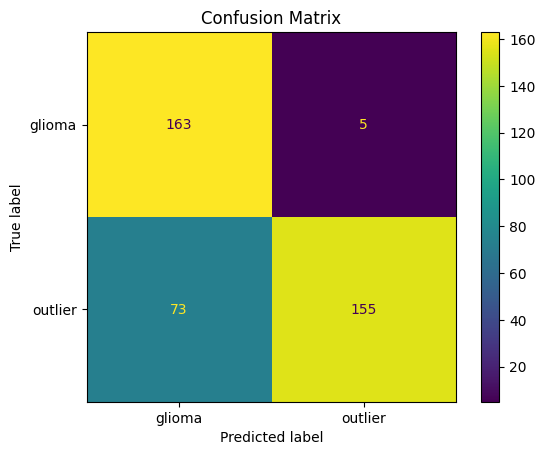












For this thereshold value 0.019666666666666666 the confusion matrix is 




              precision    recall  f1-score   support

      glioma       0.64      0.99      0.78       168
     outlier       0.99      0.59      0.74       228

    accuracy                           0.76       396
   macro avg       0.81      0.79      0.76       396
weighted avg       0.84      0.76      0.75       396









<Figure size 800x600 with 0 Axes>

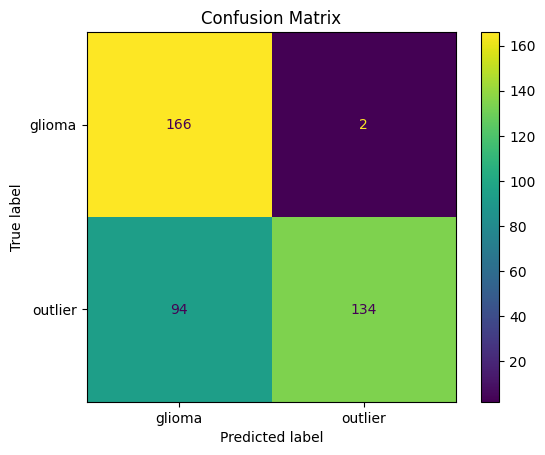












For this thereshold value 0.022333333333333334 the confusion matrix is 




              precision    recall  f1-score   support

      glioma       0.58      0.99      0.73       168
     outlier       0.98      0.48      0.64       228

    accuracy                           0.69       396
   macro avg       0.78      0.73      0.69       396
weighted avg       0.81      0.69      0.68       396









<Figure size 800x600 with 0 Axes>

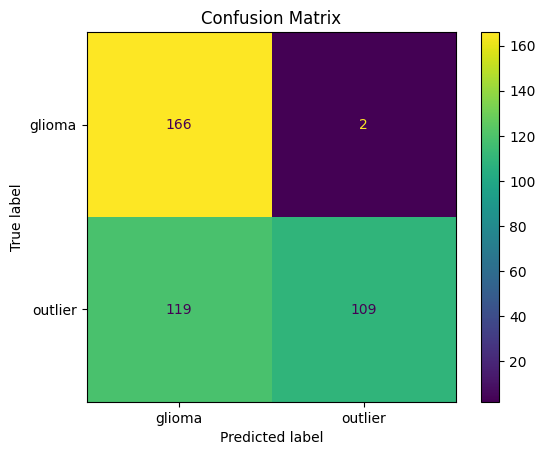












For this thereshold value 0.025 the confusion matrix is 




              precision    recall  f1-score   support

      glioma       0.54      0.99      0.70       168
     outlier       0.99      0.39      0.56       228

    accuracy                           0.64       396
   macro avg       0.77      0.69      0.63       396
weighted avg       0.80      0.64      0.62       396









<Figure size 800x600 with 0 Axes>

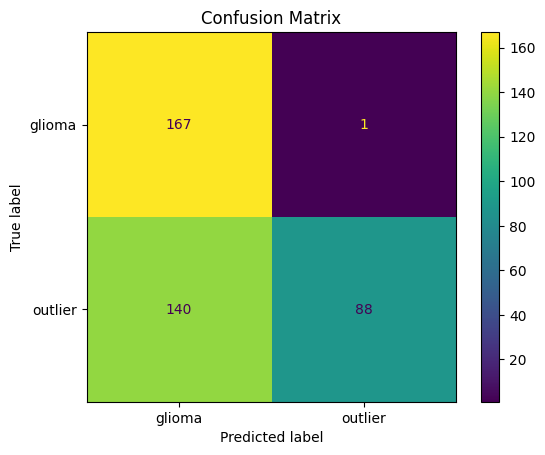

In [44]:
# Range of thereshokds
thresholds = np.linspace(0.001, 0.025, 10)



print()

# Iteration on theresholds
for threshold in thresholds:

    print("For this thereshold value",threshold, "the confusion matrix is ")
    print("\n"*3)
    preds_1 = []
    preds_2 = []

    # Iteration_tot_validation_notumor
    for error in mse_tot_validation_glioma:
        if error < threshold:
            pred = "glioma"
        else:
            pred = "outlier"
        preds_1.append(pred)

    # Iteration on  mse_simulation_validation_notumor
    for error in mse_simulation_validation_glioma:
        if error < threshold:
            pred = "glioma"
        else:
            pred = "outlier"
        preds_2.append(pred)

    # Unione delle predizioni
    y_pred_validation = preds_1 + preds_2

    # Evaluation of metric
    evaluate_metrics(y_pred_validation, y_validation)

    print("\n"*10)

thereshold = 0.012

##### Test the complete classifier

In [45]:
mse_simulation_test_glioma = []

for i  in range(len(X_test_outlier_glioma)):


  print(i)
  observation = X_test_outlier_glioma[i]
  processed_sample = observation.reshape(1,224,224,3)
  pred = autoencoder.predict(processed_sample)
  mse = mean_squared_error(pred.flatten(), observation.flatten())
  mse_simulation_test_glioma.append(mse)



mse_tot_test_glioma = []

for i in range(len(X_test_glioma)):
   print(i)
   real = X_test_glioma[i]
   preprocessed_real = real.reshape(1,224,224,3)
   pred = autoencoder.predict(preprocessed_real)
   mse = mean_squared_error(pred.flatten(), real.flatten())
   mse_tot_test_glioma.append(mse)


0
1/1 [==============================] - 0s 20ms/step
1
1/1 [==============================] - 0s 19ms/step
2
1/1 [==============================] - 0s 22ms/step
3
1/1 [==============================] - 0s 21ms/step
4
1/1 [==============================] - 0s 21ms/step
5
1/1 [==============================] - 0s 22ms/step
6
1/1 [==============================] - 0s 22ms/step
7
1/1 [==============================] - 0s 23ms/step
8
1/1 [==============================] - 0s 23ms/step
9
1/1 [==============================] - 0s 21ms/step
10
1/1 [==============================] - 0s 23ms/step
11
1/1 [==============================] - 0s 23ms/step
12
1/1 [==============================] - 0s 21ms/step
13
1/1 [==============================] - 0s 22ms/step
14
1/1 [==============================] - 0s 22ms/step
15
1/1 [==============================] - 0s 20ms/step
16
1/1 [==============================] - 0s 28ms/step
17
1/1 [==============================] - 0s 23ms/step
18
1/1 [============

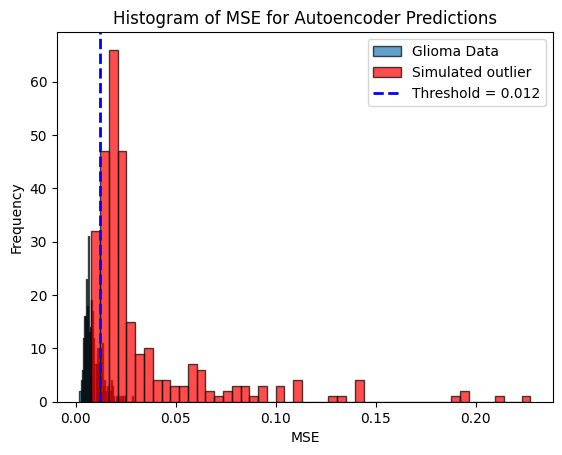

In [46]:
# Istogramma 1 (mse_tot_test)
plt.hist(mse_tot_test_glioma, bins=50, edgecolor='k', alpha=0.7, label='Glioma Data')

# Istogramma 2 (mse_simulation)
plt.hist(mse_simulation_test_glioma, bins=50, edgecolor='k', color='red', alpha=0.7, label='Simulated outlier ')

# Etichette e titolo
plt.xlabel('MSE')
plt.ylabel('Frequency')
plt.title('Histogram of MSE for Autoencoder Predictions')


threshold = 0.012
plt.axvline(threshold, color='blue', linestyle='--', linewidth=2, label=f'Threshold = {threshold}')


# Mostra la legenda
plt.legend()

# Mostra il plot
plt.show()

In [47]:
## ground_truth
list1 = ["glioma" for _ in range(len(mse_tot_test_glioma))]
list2 = ["outlier" for _ in range(len(mse_simulation_test_glioma))]

y_test = list1 + list2

              precision    recall  f1-score   support

      glioma       0.88      0.82      0.85       286
     outlier       0.83      0.89      0.86       286

    accuracy                           0.86       572
   macro avg       0.86      0.86      0.86       572
weighted avg       0.86      0.86      0.86       572









<Figure size 800x600 with 0 Axes>

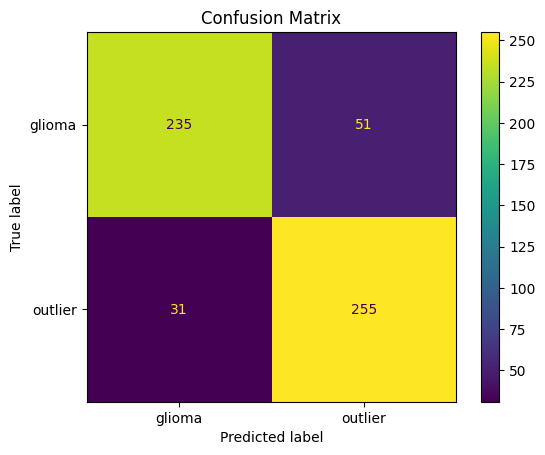

In [48]:
preds_1 = []
preds_2 = []

# Iteration_tot_validation_glioma
for error in mse_tot_test_glioma:
    if error < threshold:
        pred = "glioma"
    else:
        pred = "outlier"
    preds_1.append(pred)

# Iteration on  mse_simulation_validation_glioma
for error in mse_simulation_test_glioma:
    if error < threshold:
        pred = "glioma"
    else:
        pred = "outlier"
    preds_2.append(pred)

# Unione delle predizioni
y_pred_test = preds_1 + preds_2

# Evaluation of metric
evaluate_metrics(y_pred_test, y_test)

#####Showing the original image and reconstructed image

1/1 [==============================] - 0s 47ms/step


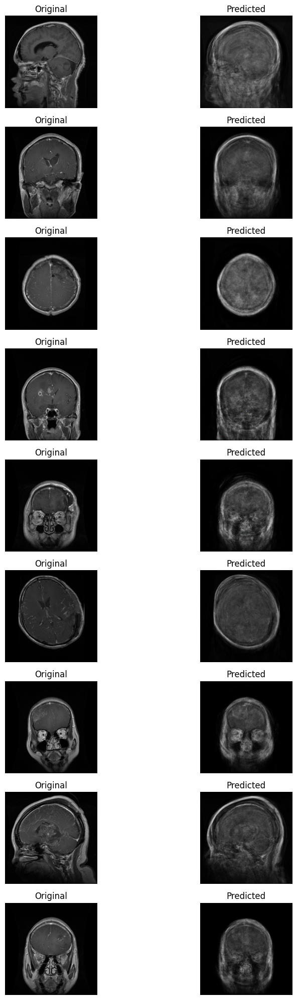

In [ ]:
plt.figure(figsize=(10, 20))

# Displaying 9 images in a 2x9 grid (2 columns, 9 rows)
for i in range(0,9):
    # Original image
    plt.subplot(9, 2, 2 * i + 1)
    real = X_test_glioma[i].astype(np.float32)
    plt.imshow(real)
    plt.title('Original')
    plt.axis('off')

    # Predicted image
    plt.subplot(9, 2, 2 * i + 2)
    z = real.reshape(1, 224, 224, 3)
    k = autoencoder.predict(z)
    k_new = k[0, :, :, :]
    plt.imshow(k_new)
    plt.title('Predicted')
    plt.axis('off')

plt.tight_layout()
plt.show()

1/1 [==============================] - 0s 28ms/step


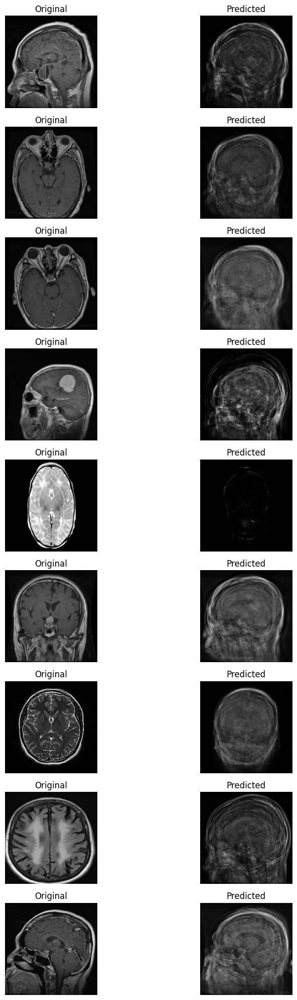

In [ ]:
plt.figure(figsize=(10, 20))

# Displaying 9 images in a 2x9 grid (2 columns, 9 rows)
for i in range(9):
    # Original image
    plt.subplot(9, 2, 2 * i + 1)
    real = X_test_outlier_glioma[i].astype(np.float32)
    plt.imshow(real)
    plt.title('Original')
    plt.axis('off')

    # Predicted image
    plt.subplot(9, 2, 2 * i + 2)
    z = real.reshape(1, 224, 224, 3)
    k = autoencoder.predict(z)
    k_new = k[0, :, :, :]
    plt.imshow(k_new)
    plt.title('Predicted')
    plt.axis('off')

plt.tight_layout()
plt.show()

#Outlier detection meningioma

##Create the train and test set for meningioma

In [51]:
X = []

# Iterate through the values in the "Preprocessed_vgg16" column.
for i,x in enumerate(df_meningioma["Image"].values):
    x = x/255
    # Reshape each image to the required input shape for the VGG16 model.
    new = x.reshape(1, 224, 224, 3)

    # Add the reshaped image to the list.
    X.append(new)

X = np.vstack(X)
X= X.astype(np.float16)

In [52]:
X_train_meningioma, X_test_meningioma = train_test_split(X, test_size=0.2, random_state=42)

##Train

In [53]:
del X

In [54]:
autoencoder.compile(optimizer=Adam(learning_rate=0.0005), loss='mse')

In [55]:
history = autoencoder.fit(X_train_meningioma,X_train_meningioma,
                          epochs=50,
                          batch_size=32,
                          shuffle=True,
                          validation_split=0.2)

Epoch 1/50
15/15 [==============================] - 4s 93ms/step - loss: 0.0902 - val_loss: 0.0285
Epoch 2/50
15/15 [==============================] - 1s 67ms/step - loss: 0.0247 - val_loss: 0.0194
Epoch 3/50
15/15 [==============================] - 1s 73ms/step - loss: 0.0196 - val_loss: 0.0185
Epoch 4/50
15/15 [==============================] - 1s 77ms/step - loss: 0.0183 - val_loss: 0.0169
Epoch 5/50
15/15 [==============================] - 1s 74ms/step - loss: 0.0170 - val_loss: 0.0163
Epoch 6/50
15/15 [==============================] - 1s 73ms/step - loss: 0.0167 - val_loss: 0.0160
Epoch 7/50
15/15 [==============================] - 1s 66ms/step - loss: 0.0164 - val_loss: 0.0159
Epoch 8/50
15/15 [==============================] - 1s 67ms/step - loss: 0.0161 - val_loss: 0.0152
Epoch 9/50
15/15 [==============================] - 1s 66ms/step - loss: 0.0156 - val_loss: 0.0150
Epoch 10/50
15/15 [==============================] - 1s 65ms/step - loss: 0.0153 - val_loss: 0.0149
Epoch 11/

In [56]:
# to clean the cpu

import gc
gc.collect()

41778

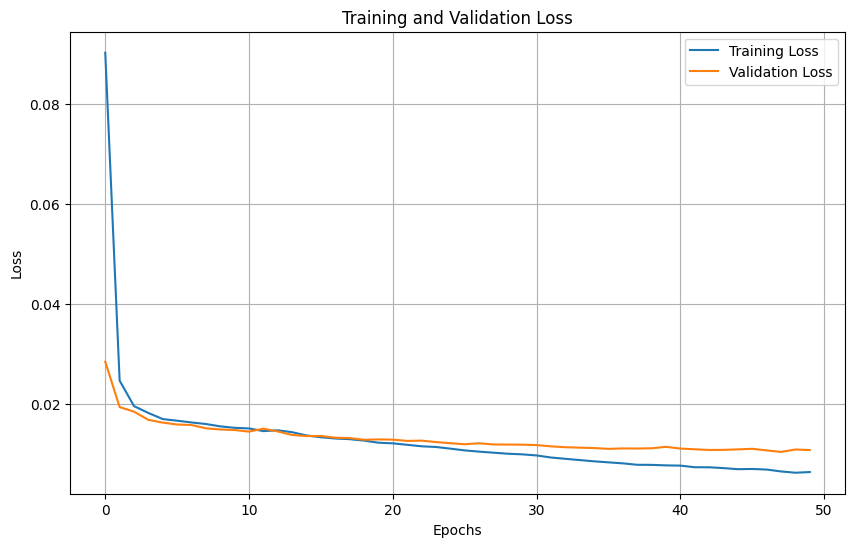

In [57]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
"""autoencoder.save('/content/drive/MyDrive/ProgettoDataMining/autoencoder_meningioma.keras')"""

##  Show the result for meningioma

In [59]:
## one time that the model is been trained you just load the model
autoencoder = tf.keras.models.load_model('/content/drive/MyDrive/ProgettoDataMining/autoencoder_meningioma.keras')

### External Validation

#####SImulation of the outlier for notumor

In [60]:
len(X_train_meningioma)

566

In [61]:
len(X_test_meningioma)

142

In [62]:
import random

### 113 for validation and 142 for test
n = 255

simulation = []

for i in range(n):

  random.seed(i)
  df = random.choice([df_notumor, df_glioma, df_pituitary_tumor])
  sample = df.sample(n=1, random_state=i)
  sample = (sample.iloc[0,0])/255
  simulation.append(sample)


In [63]:
X_val_outlier_meningioma = simulation[:113]
X_test_outlier_meningioma = simulation[113:]

In [64]:
X_val_meningioma = X_train_meningioma[453:566]


####Classifer and thereshold validation

In [65]:
mse_simulation_validation_meningioma = []

for i  in range(len(X_val_outlier_meningioma)):
  print(i)
  observation = X_val_outlier_meningioma[i]
  processed_sample = observation.reshape(1,224,224,3)
  pred = autoencoder.predict(processed_sample)
  mse = mean_squared_error(pred.flatten(), observation.flatten())
  mse_simulation_validation_meningioma.append(mse)



mse_tot_validation_meningioma = []

for i in range(len(X_val_meningioma)):
   print(i)
   real = X_val_meningioma[i]
   preprocessed_real= real.reshape(1,224,224,3)
   pred = autoencoder.predict(preprocessed_real)
   mse = mean_squared_error(pred.flatten(), real.flatten())
   mse_tot_validation_meningioma.append(mse)


0
1/1 [==============================] - 0s 425ms/step
1
1/1 [==============================] - 0s 20ms/step
2
1/1 [==============================] - 0s 20ms/step
3
1/1 [==============================] - 0s 19ms/step
4
1/1 [==============================] - 0s 29ms/step
5
1/1 [==============================] - 0s 20ms/step
6
1/1 [==============================] - 0s 20ms/step
7
1/1 [==============================] - 0s 23ms/step
8
1/1 [==============================] - 0s 31ms/step
9
1/1 [==============================] - 0s 19ms/step
10
1/1 [==============================] - 0s 21ms/step
11
1/1 [==============================] - 0s 22ms/step
12
1/1 [==============================] - 0s 25ms/step
13
1/1 [==============================] - 0s 20ms/step
14
1/1 [==============================] - 0s 21ms/step
15
1/1 [==============================] - 0s 20ms/step
16
1/1 [==============================] - 0s 21ms/step
17
1/1 [==============================] - 0s 28ms/step
18
1/1 [===========

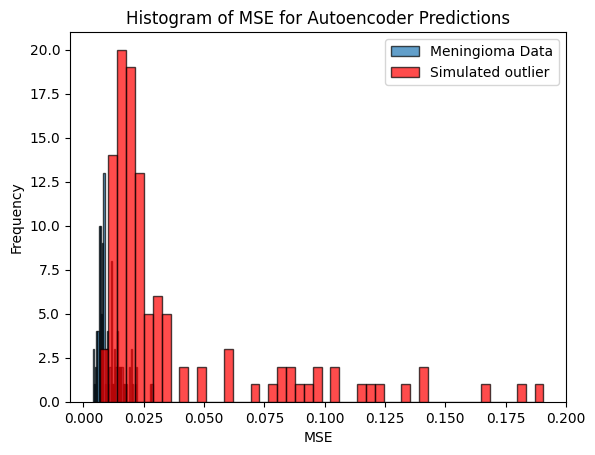

In [ ]:
import matplotlib.pyplot as plt

# Istogramma 1 (mse_tot_test)
plt.hist(mse_tot_validation_meningioma,bins = 50, edgecolor='k', alpha=0.7, label='Meningioma Data')

# Istogramma 2 (mse_simulation)
plt.hist(mse_simulation_validation_meningioma, bins=50, edgecolor='k', color='red', alpha=0.7, label='Simulated outlier ')

# Etichette e titolo
plt.xlabel('MSE')
plt.ylabel('Frequency')
plt.title('Histogram of MSE for Autoencoder Predictions')

# Mostra la legenda
plt.legend()

# Mostra il plot
plt.show()

##### Validation for thereshold

In [ ]:
## ground_truth
list1 = ["meningioma" for _ in range(len(mse_tot_validation_meningioma))]
list2 = ["outlier" for _ in range(len(mse_simulation_validation_meningioma))]

y_validation = list1 + list2


For this thereshold value 0.01 the confusion matrix is 




              precision    recall  f1-score   support

  meningioma       0.96      0.59      0.73       113
     outlier       0.71      0.97      0.82       113

    accuracy                           0.78       226
   macro avg       0.83      0.78      0.78       226
weighted avg       0.83      0.78      0.78       226









<Figure size 800x600 with 0 Axes>

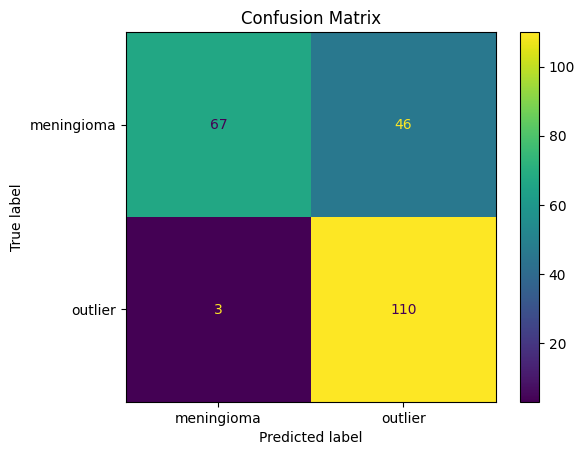












For this thereshold value 0.011666666666666667 the confusion matrix is 




              precision    recall  f1-score   support

  meningioma       0.93      0.71      0.80       113
     outlier       0.76      0.95      0.85       113

    accuracy                           0.83       226
   macro avg       0.85      0.83      0.82       226
weighted avg       0.85      0.83      0.82       226









<Figure size 800x600 with 0 Axes>

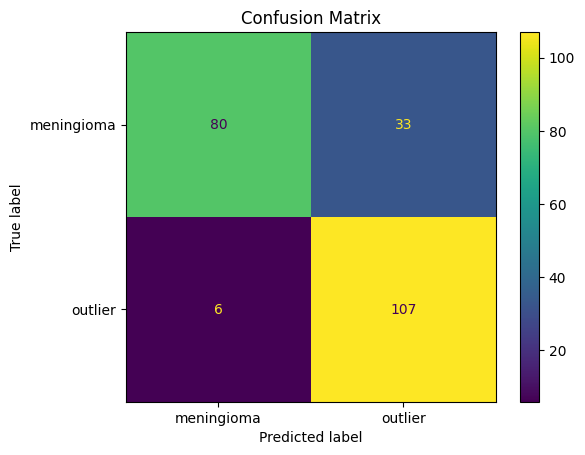












For this thereshold value 0.013333333333333334 the confusion matrix is 




              precision    recall  f1-score   support

  meningioma       0.89      0.77      0.82       113
     outlier       0.80      0.90      0.85       113

    accuracy                           0.84       226
   macro avg       0.84      0.84      0.84       226
weighted avg       0.84      0.84      0.84       226









<Figure size 800x600 with 0 Axes>

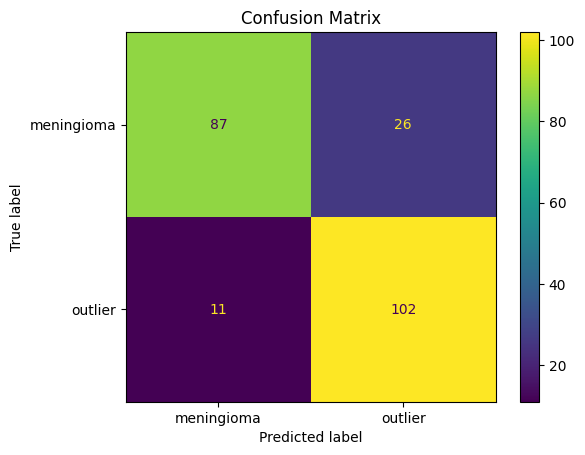












For this thereshold value 0.015 the confusion matrix is 




              precision    recall  f1-score   support

  meningioma       0.82      0.84      0.83       113
     outlier       0.84      0.81      0.83       113

    accuracy                           0.83       226
   macro avg       0.83      0.83      0.83       226
weighted avg       0.83      0.83      0.83       226









<Figure size 800x600 with 0 Axes>

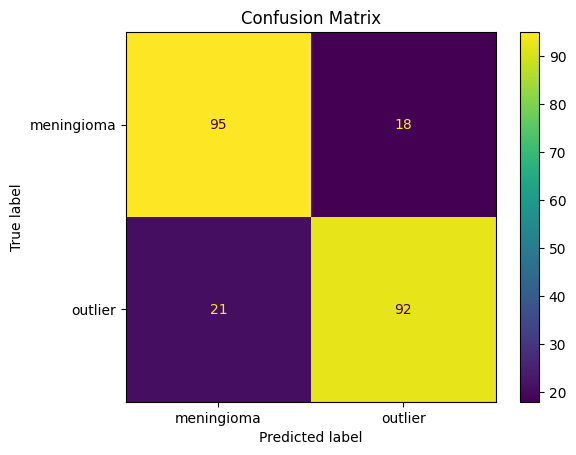












For this thereshold value 0.016666666666666666 the confusion matrix is 




              precision    recall  f1-score   support

  meningioma       0.76      0.88      0.81       113
     outlier       0.85      0.73      0.78       113

    accuracy                           0.80       226
   macro avg       0.81      0.80      0.80       226
weighted avg       0.81      0.80      0.80       226









<Figure size 800x600 with 0 Axes>

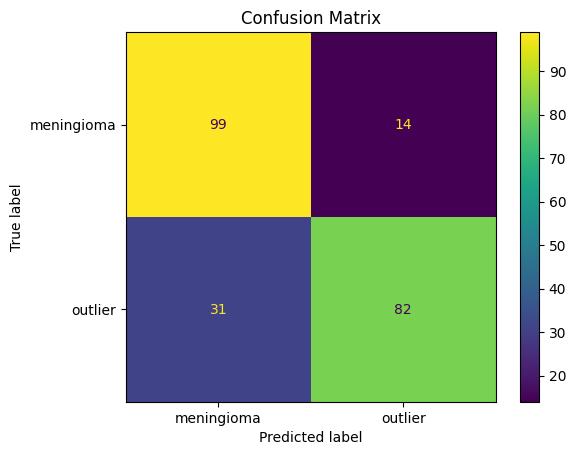












For this thereshold value 0.018333333333333333 the confusion matrix is 




              precision    recall  f1-score   support

  meningioma       0.72      0.90      0.80       113
     outlier       0.87      0.65      0.75       113

    accuracy                           0.78       226
   macro avg       0.80      0.78      0.78       226
weighted avg       0.80      0.78      0.78       226









<Figure size 800x600 with 0 Axes>

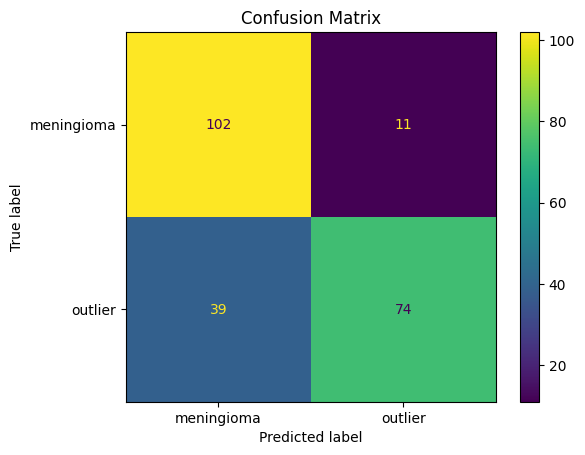












For this thereshold value 0.02 the confusion matrix is 




              precision    recall  f1-score   support

  meningioma       0.68      0.93      0.78       113
     outlier       0.89      0.56      0.68       113

    accuracy                           0.74       226
   macro avg       0.78      0.74      0.73       226
weighted avg       0.78      0.74      0.73       226









<Figure size 800x600 with 0 Axes>

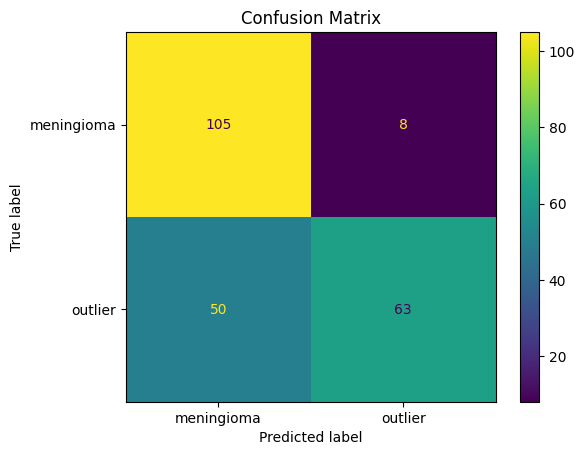












For this thereshold value 0.021666666666666667 the confusion matrix is 




              precision    recall  f1-score   support

  meningioma       0.66      0.96      0.78       113
     outlier       0.93      0.50      0.65       113

    accuracy                           0.73       226
   macro avg       0.79      0.73      0.71       226
weighted avg       0.79      0.73      0.71       226









<Figure size 800x600 with 0 Axes>

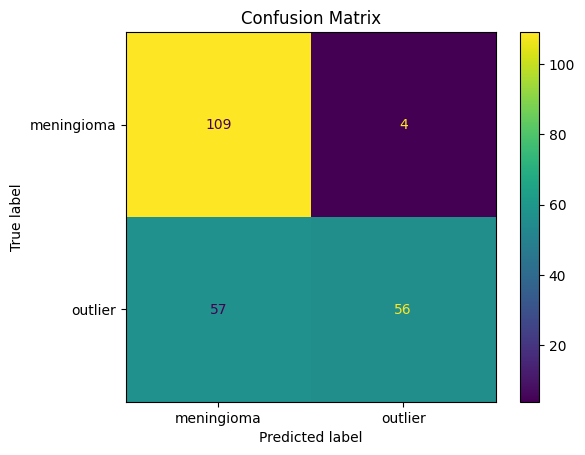












For this thereshold value 0.023333333333333334 the confusion matrix is 




              precision    recall  f1-score   support

  meningioma       0.64      0.98      0.77       113
     outlier       0.96      0.44      0.61       113

    accuracy                           0.71       226
   macro avg       0.80      0.71      0.69       226
weighted avg       0.80      0.71      0.69       226









<Figure size 800x600 with 0 Axes>

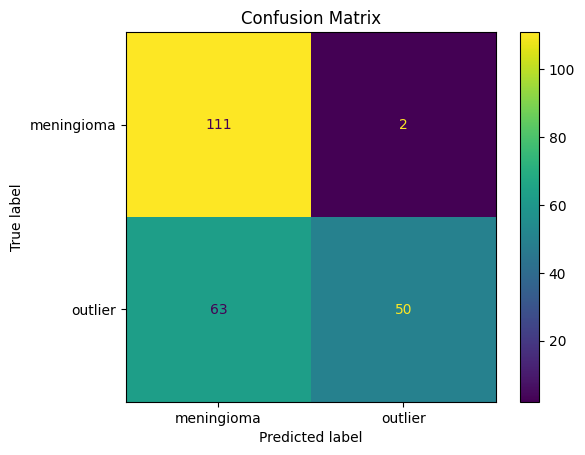












For this thereshold value 0.025 the confusion matrix is 




              precision    recall  f1-score   support

  meningioma       0.62      0.98      0.76       113
     outlier       0.96      0.40      0.56       113

    accuracy                           0.69       226
   macro avg       0.79      0.69      0.66       226
weighted avg       0.79      0.69      0.66       226









<Figure size 800x600 with 0 Axes>

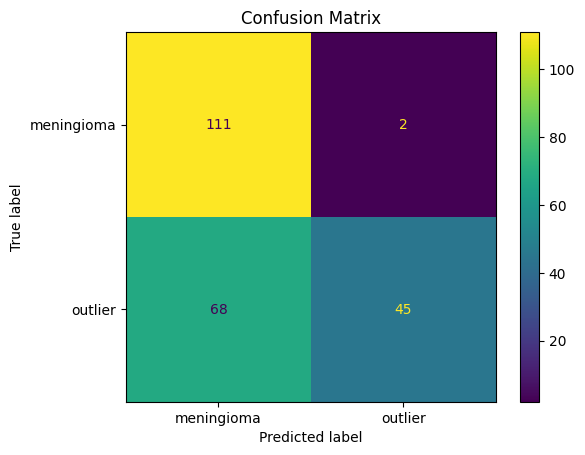

In [ ]:
# Range of thereshokds
thresholds = np.linspace(0.010, 0.025, 10)



print()

# Iteration on theresholds
for threshold in thresholds:

    print("For this thereshold value",threshold, "the confusion matrix is ")
    print("\n"*3)
    preds_1 = []
    preds_2 = []

    # Iteration_tot_validation_notumor
    for error in mse_tot_validation_meningioma:
        if error < threshold:
            pred = "meningioma"
        else:
            pred = "outlier"
        preds_1.append(pred)

    # Iteration on  mse_simulation_validation_notumor
    for error in mse_simulation_validation_meningioma:
        if error < threshold:
            pred = "meningioma"
        else:
            pred = "outlier"
        preds_2.append(pred)

    # Unione delle predizioni
    y_pred_validation = preds_1 + preds_2

    # Evaluation of metric
    evaluate_metrics(y_pred_validation, y_validation)

    print("\n"*10)

thereshold = 0.013

##### Test the complete classifier

In [ ]:
mse_simulation_test_meningioma = []

for i  in range(len(X_test_outlier_meningioma)):


  print(i)
  observation = X_test_outlier_meningioma[i]
  processed_sample = observation.reshape(1,224,224,3)
  pred = autoencoder.predict(processed_sample)
  mse = mean_squared_error(pred.flatten(), observation.flatten())
  mse_simulation_test_meningioma.append(mse)



mse_tot_test_meningioma = []

for i in range(len(X_test_meningioma)):
   print(i)
   real = X_test_meningioma[i]
   preprocessed_real = real.reshape(1,224,224,3)
   pred = autoencoder.predict(preprocessed_real)
   mse = mean_squared_error(pred.flatten(), real.flatten())
   mse_tot_test_meningioma.append(mse)


0
1/1 [==============================] - 0s 40ms/step
1
1/1 [==============================] - 0s 51ms/step
2
1/1 [==============================] - 0s 19ms/step
3
1/1 [==============================] - 0s 18ms/step
4
1/1 [==============================] - 0s 19ms/step
5
1/1 [==============================] - 0s 18ms/step
6
1/1 [==============================] - 0s 18ms/step
7
1/1 [==============================] - 0s 18ms/step
8
1/1 [==============================] - 0s 18ms/step
9
1/1 [==============================] - 0s 18ms/step
10
1/1 [==============================] - 0s 21ms/step
11
1/1 [==============================] - 0s 17ms/step
12
1/1 [==============================] - 0s 20ms/step
13
1/1 [==============================] - 0s 18ms/step
14
1/1 [==============================] - 0s 26ms/step
15
1/1 [==============================] - 0s 22ms/step
16
1/1 [==============================] - 0s 21ms/step
17
1/1 [==============================] - 0s 21ms/step
18
1/1 [============

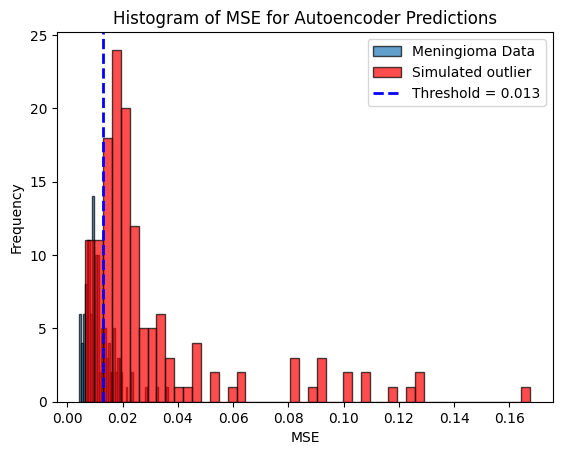

In [ ]:
# Istogramma 1 (mse_tot_test)
plt.hist(mse_tot_test_meningioma, bins=50, edgecolor='k', alpha=0.7, label='Meningioma Data')

# Istogramma 2 (mse_simulation)
plt.hist(mse_simulation_test_meningioma, bins=50, edgecolor='k', color='red', alpha=0.7, label='Simulated outlier ')

# Etichette e titolo
plt.xlabel('MSE')
plt.ylabel('Frequency')
plt.title('Histogram of MSE for Autoencoder Predictions')


threshold = 0.013
plt.axvline(threshold, color='blue', linestyle='--', linewidth=2, label=f'Threshold = {threshold}')


# Mostra la legenda
plt.legend()

# Mostra il plot
plt.show()

In [ ]:
## ground_truth
list1 = ["meningioma" for _ in range(len(mse_tot_test_meningioma))]
list2 = ["outlier" for _ in range(len(mse_simulation_test_meningioma))]

y_test = list1 + list2

              precision    recall  f1-score   support

  meningioma       0.82      0.72      0.77       142
     outlier       0.75      0.85      0.79       142

    accuracy                           0.78       284
   macro avg       0.79      0.78      0.78       284
weighted avg       0.79      0.78      0.78       284









<Figure size 800x600 with 0 Axes>

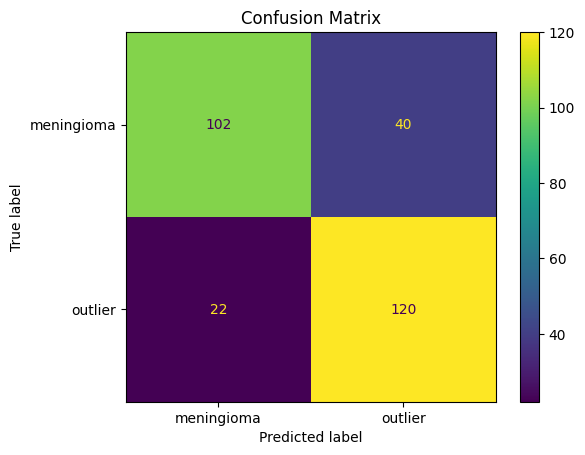

In [ ]:
preds_1 = []
preds_2 = []

# Iteration_tot_validation_notumor
for error in mse_tot_test_meningioma:
    if error < threshold:
        pred = "meningioma"
    else:
        pred = "outlier"
    preds_1.append(pred)

# Iteration on  mse_simulation_validation_notumor
for error in mse_simulation_test_meningioma:
    if error < threshold:
        pred = "meningioma"
    else:
        pred = "outlier"
    preds_2.append(pred)

# Unione delle predizioni
y_pred_test = preds_1 + preds_2

# Evaluation of metric
evaluate_metrics(y_pred_test, y_test)

#####Showing the original image and reconstructed image

####### on the trained class

1/1 [==============================] - 0s 22ms/step


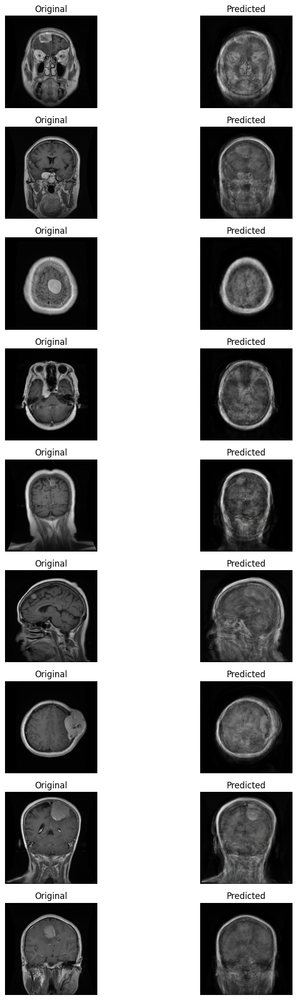

In [ ]:
plt.figure(figsize=(10, 20))

# Displaying 9 images in a 2x9 grid (2 columns, 9 rows)
for i in range(9):
    # Original image
    plt.subplot(9, 2, 2 * i + 1)
    real = X_test_meningioma[i].astype(np.float32)
    plt.imshow(real)
    plt.title('Original')
    plt.axis('off')

    # Predicted image
    plt.subplot(9, 2, 2 * i + 2)
    z = real.reshape(1, 224, 224, 3)
    k = autoencoder.predict(z)
    k_new = k[0, :, :, :]
    plt.imshow(k_new)
    plt.title('Predicted')
    plt.axis('off')

plt.tight_layout()
plt.show()

#######on the outlier class

1/1 [==============================] - 0s 31ms/step


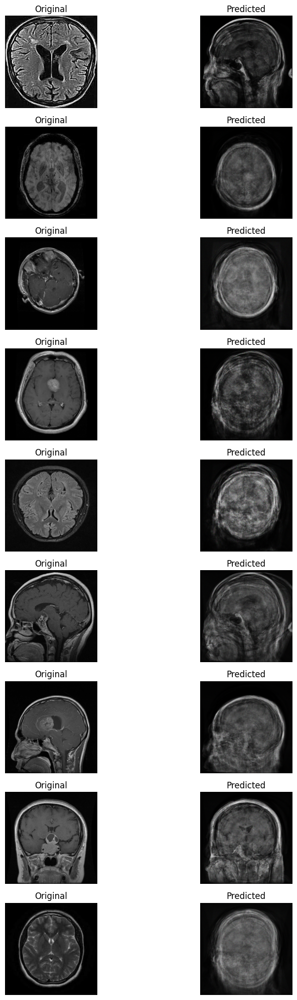

In [ ]:
plt.figure(figsize=(10, 20))

# Displaying 9 images in a 2x9 grid (2 columns, 9 rows)
for i in range(9):
    # Original image
    plt.subplot(9, 2, 2 * i + 1)
    real = X_test_outlier_meningioma[i].astype(np.float32)
    plt.imshow(real)
    plt.title('Original')
    plt.axis('off')

    # Predicted image
    plt.subplot(9, 2, 2 * i + 2)
    z = real.reshape(1, 224, 224, 3)
    k = autoencoder.predict(z)
    k_new = k[0, :, :, :]
    plt.imshow(k_new)
    plt.title('Predicted')
    plt.axis('off')

plt.tight_layout()
plt.show()

#Outlier detection pitiguary

##Create the train and test set for npitiguary

In [69]:
X = []

# Iterate through the values in the "Preprocessed_vgg16" column.
for i,x in enumerate(df_pituitary_tumor["Image"].values):
    x = x/255
    # Reshape each image to the required input shape for the VGG16 model.
    new = x.reshape(1, 224, 224, 3)

    # Add the reshaped image to the list.
    X.append(new)

X = np.vstack(X)
X= X.astype(np.float16)

In [70]:
X_train_pitiguary_tumor, X_test_pitiguary_tumor = train_test_split(X, test_size=0.2, random_state=42)

##Train

In [71]:
del X

In [72]:
autoencoder.compile(optimizer=Adam(learning_rate=0.0005), loss='mse')

In [73]:
history = autoencoder.fit(X_train_pitiguary_tumor,X_train_pitiguary_tumor,
                          epochs=50,
                          batch_size=32,
                          shuffle=True,
                          validation_split=0.2)

Epoch 1/50
19/19 [==============================] - 7s 113ms/step - loss: 0.0631 - val_loss: 0.0215
Epoch 2/50
19/19 [==============================] - 1s 73ms/step - loss: 0.0200 - val_loss: 0.0186
Epoch 3/50
19/19 [==============================] - 1s 68ms/step - loss: 0.0181 - val_loss: 0.0175
Epoch 4/50
19/19 [==============================] - 1s 68ms/step - loss: 0.0169 - val_loss: 0.0165
Epoch 5/50
19/19 [==============================] - 1s 70ms/step - loss: 0.0160 - val_loss: 0.0157
Epoch 6/50
19/19 [==============================] - 1s 67ms/step - loss: 0.0151 - val_loss: 0.0148
Epoch 7/50
19/19 [==============================] - 1s 70ms/step - loss: 0.0147 - val_loss: 0.0148
Epoch 8/50
19/19 [==============================] - 1s 70ms/step - loss: 0.0143 - val_loss: 0.0145
Epoch 9/50
19/19 [==============================] - 1s 68ms/step - loss: 0.0139 - val_loss: 0.0140
Epoch 10/50
19/19 [==============================] - 1s 74ms/step - loss: 0.0134 - val_loss: 0.0138
Epoch 11

In [ ]:
# to clean the cpu

import gc
gc.collect()

1353

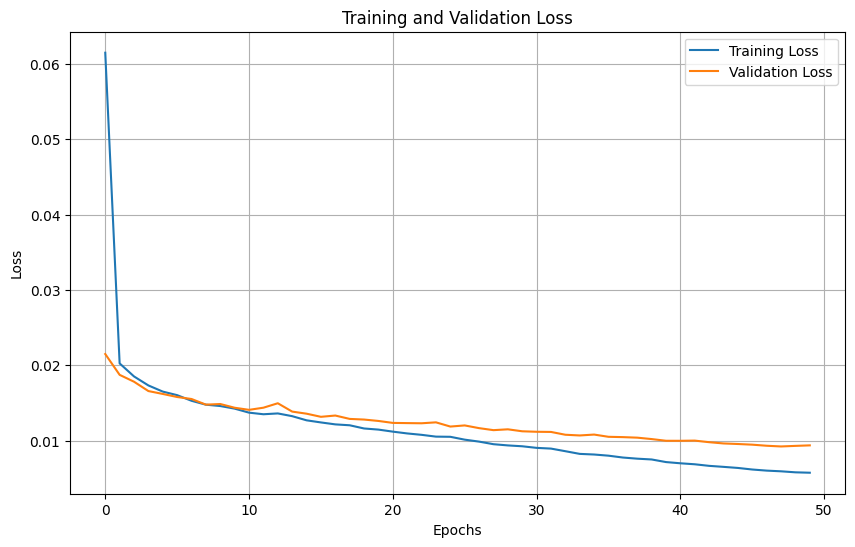

In [ ]:
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()

In [ ]:
"""autoencoder.save('/content/drive/MyDrive/ProgettoDataMining/autoencoder_pitiguary.keras') """

##  Show the result for pitiguary

In [ ]:
## one time that the model is been trained you just load the model
autoencoder = tf.keras.models.load_model('/content/drive/MyDrive/ProgettoDataMining/autoencoder_pitiguary.keras')

### External Validation

#####SImulation of the outlier for notumor

In [ ]:
len(X_train_pitiguary_tumor)

744

In [ ]:
len(X_test_pitiguary_tumor)

186

In [ ]:
import random

### 149 for validation and 186 for test
n = 335

simulation = []

for i in range(n):

  random.seed(i)
  df = random.choice([df_meningioma, df_glioma, df_notumor])
  sample = df.sample(n=1, random_state=i)
  sample = (sample.iloc[0,0])/255
  simulation.append(sample)


In [ ]:
X_val_outlier_pitiguary_tumor = simulation[:149]
X_test_outlier_pitiguary_tumor = simulation[149:]

In [ ]:
X_val_pitiguary_tumor = X_train_pitiguary_tumor[595:]
#X_test_notumor are always the same

####Classifer and thereshold validation

##### visualization for an  idea of  the range of theresholds

In [ ]:
mse_simulation_validation_pitiguary_tumor = []

for i  in range(len(X_val_outlier_pitiguary_tumor)):
  print(i)
  observation = X_val_outlier_pitiguary_tumor[i]
  processed_sample = observation.reshape(1,224,224,3)
  pred = autoencoder.predict(processed_sample)
  mse = mean_squared_error(pred.flatten(), observation.flatten())
  mse_simulation_validation_pitiguary_tumor.append(mse)



mse_tot_validation_pitiguary_tumor = []

for i in range(len(X_val_pitiguary_tumor)):
   print(i)
   real = X_val_pitiguary_tumor[i]
   preprocessed_real= real.reshape(1,224,224,3)
   pred = autoencoder.predict(preprocessed_real)
   mse = mean_squared_error(pred.flatten(), real.flatten())
   mse_tot_validation_pitiguary_tumor.append(mse)


0
1/1 [==============================] - 1s 639ms/step
1
1/1 [==============================] - 0s 73ms/step
2
1/1 [==============================] - 0s 72ms/step
3
1/1 [==============================] - 0s 117ms/step
4
1/1 [==============================] - 0s 43ms/step
5
1/1 [==============================] - 0s 32ms/step
6
1/1 [==============================] - 0s 36ms/step
7
1/1 [==============================] - 0s 41ms/step
8
1/1 [==============================] - 0s 104ms/step
9
1/1 [==============================] - 0s 50ms/step
10
1/1 [==============================] - 0s 30ms/step
11
1/1 [==============================] - 0s 56ms/step
12
1/1 [==============================] - 0s 54ms/step
13
1/1 [==============================] - 0s 28ms/step
14
1/1 [==============================] - 0s 57ms/step
15
1/1 [==============================] - 0s 34ms/step
16
1/1 [==============================] - 0s 32ms/step
17
1/1 [==============================] - 0s 36ms/step
18
1/1 [=========

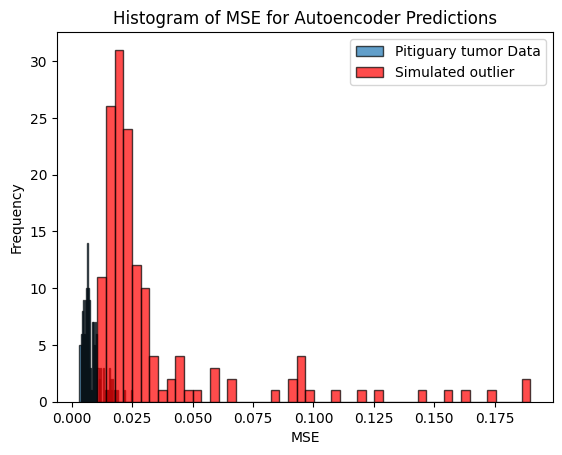

In [ ]:
import matplotlib.pyplot as plt

# Istogramma 1 (mse_tot_test)
plt.hist(mse_tot_validation_pitiguary_tumor, bins=50, edgecolor='k', alpha=0.7, label='Pitiguary tumor Data')

# Istogramma 2 (mse_simulation)
plt.hist(mse_simulation_validation_pitiguary_tumor, bins=50, edgecolor='k', color='red', alpha=0.7, label='Simulated outlier ')

# Etichette e titolo
plt.xlabel('MSE')
plt.ylabel('Frequency')
plt.title('Histogram of MSE for Autoencoder Predictions')

# Mostra la legenda
plt.legend()

# Mostra il plot
plt.show()

##### Validation for thereshold

In [ ]:
## ground_truth
list1 = ["pitiguary_tumor" for _ in range(len(mse_tot_validation_pitiguary_tumor))]
list2 = ["outlier" for _ in range(len(mse_simulation_validation_pitiguary_tumor))]

y_validation = list1 + list2


For this thereshold value 0.01 the confusion matrix is 




                 precision    recall  f1-score   support

        outlier       0.80      1.00      0.89       149
pitiguary_tumor       1.00      0.74      0.85       149

       accuracy                           0.87       298
      macro avg       0.90      0.87      0.87       298
   weighted avg       0.90      0.87      0.87       298









<Figure size 800x600 with 0 Axes>

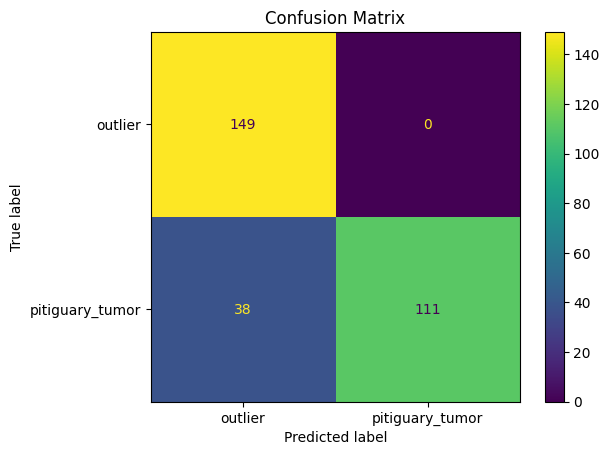












For this thereshold value 0.011666666666666667 the confusion matrix is 




                 precision    recall  f1-score   support

        outlier       0.87      0.99      0.92       149
pitiguary_tumor       0.98      0.85      0.91       149

       accuracy                           0.92       298
      macro avg       0.93      0.92      0.92       298
   weighted avg       0.93      0.92      0.92       298









<Figure size 800x600 with 0 Axes>

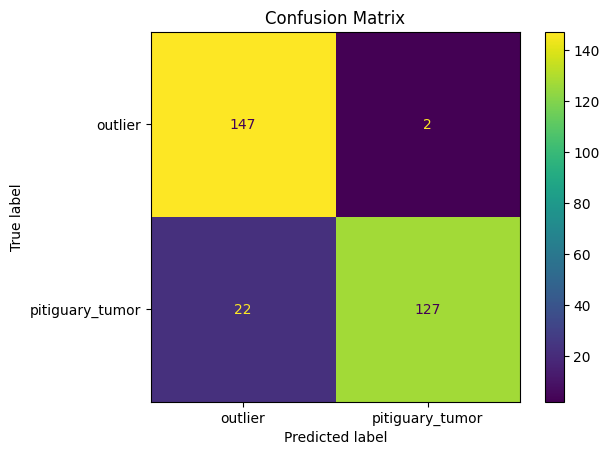












For this thereshold value 0.013333333333333334 the confusion matrix is 




                 precision    recall  f1-score   support

        outlier       0.90      0.94      0.92       149
pitiguary_tumor       0.94      0.89      0.91       149

       accuracy                           0.92       298
      macro avg       0.92      0.92      0.92       298
   weighted avg       0.92      0.92      0.92       298









<Figure size 800x600 with 0 Axes>

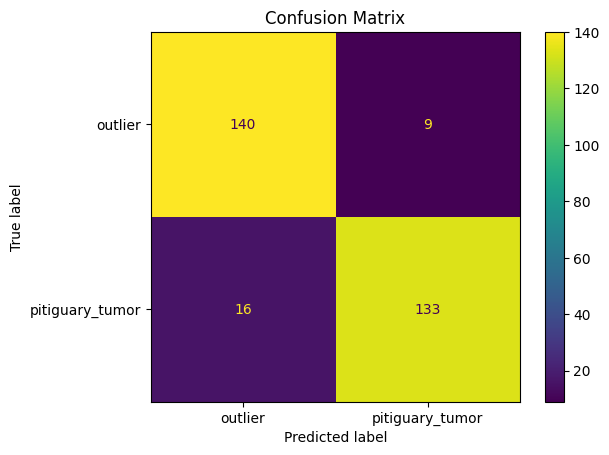












For this thereshold value 0.015 the confusion matrix is 




                 precision    recall  f1-score   support

        outlier       0.91      0.90      0.91       149
pitiguary_tumor       0.90      0.91      0.91       149

       accuracy                           0.91       298
      macro avg       0.91      0.91      0.91       298
   weighted avg       0.91      0.91      0.91       298









<Figure size 800x600 with 0 Axes>

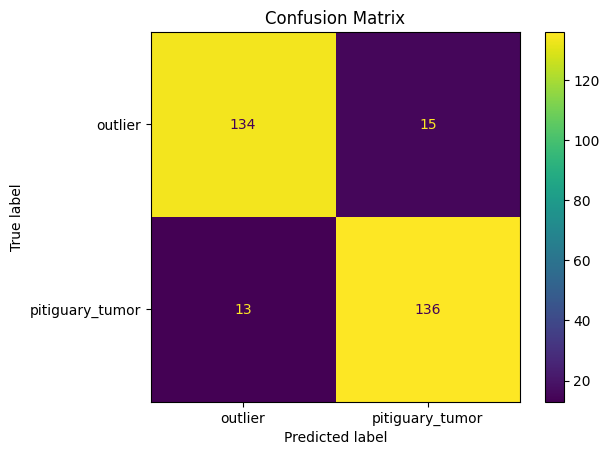












For this thereshold value 0.016666666666666666 the confusion matrix is 




                 precision    recall  f1-score   support

        outlier       0.95      0.82      0.88       149
pitiguary_tumor       0.84      0.95      0.89       149

       accuracy                           0.89       298
      macro avg       0.89      0.89      0.89       298
   weighted avg       0.89      0.89      0.89       298









<Figure size 800x600 with 0 Axes>

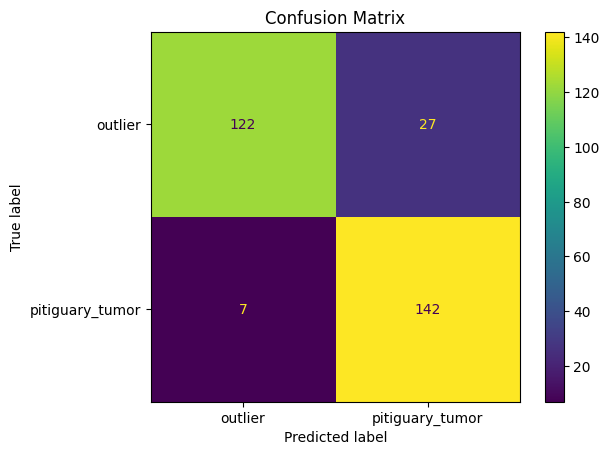












For this thereshold value 0.018333333333333333 the confusion matrix is 




                 precision    recall  f1-score   support

        outlier       0.97      0.72      0.83       149
pitiguary_tumor       0.78      0.98      0.87       149

       accuracy                           0.85       298
      macro avg       0.88      0.85      0.85       298
   weighted avg       0.88      0.85      0.85       298









<Figure size 800x600 with 0 Axes>

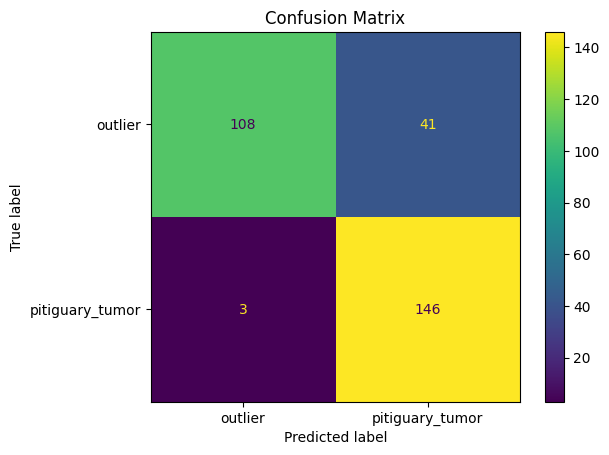












For this thereshold value 0.02 the confusion matrix is 




                 precision    recall  f1-score   support

        outlier       0.98      0.65      0.78       149
pitiguary_tumor       0.74      0.99      0.84       149

       accuracy                           0.82       298
      macro avg       0.86      0.82      0.81       298
   weighted avg       0.86      0.82      0.81       298









<Figure size 800x600 with 0 Axes>

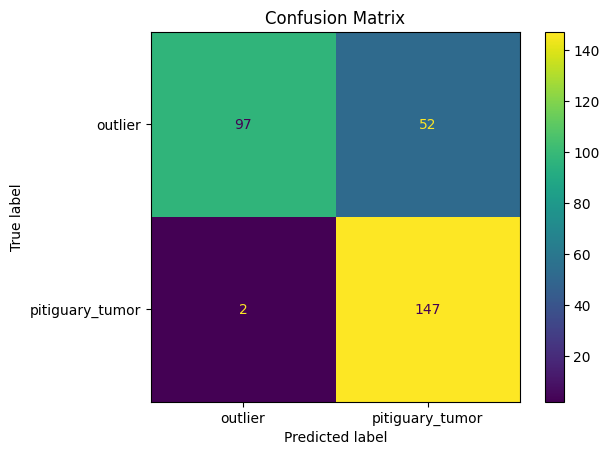












For this thereshold value 0.021666666666666667 the confusion matrix is 




                 precision    recall  f1-score   support

        outlier       0.98      0.53      0.69       149
pitiguary_tumor       0.68      0.99      0.80       149

       accuracy                           0.76       298
      macro avg       0.83      0.76      0.75       298
   weighted avg       0.83      0.76      0.75       298









<Figure size 800x600 with 0 Axes>

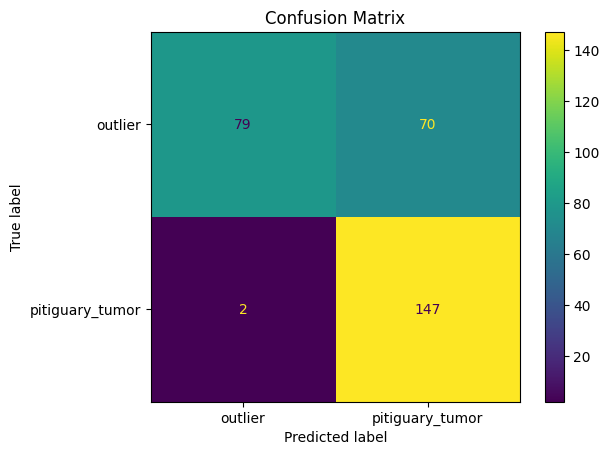












For this thereshold value 0.023333333333333334 the confusion matrix is 




                 precision    recall  f1-score   support

        outlier       0.99      0.45      0.62       149
pitiguary_tumor       0.64      0.99      0.78       149

       accuracy                           0.72       298
      macro avg       0.81      0.72      0.70       298
   weighted avg       0.81      0.72      0.70       298









<Figure size 800x600 with 0 Axes>

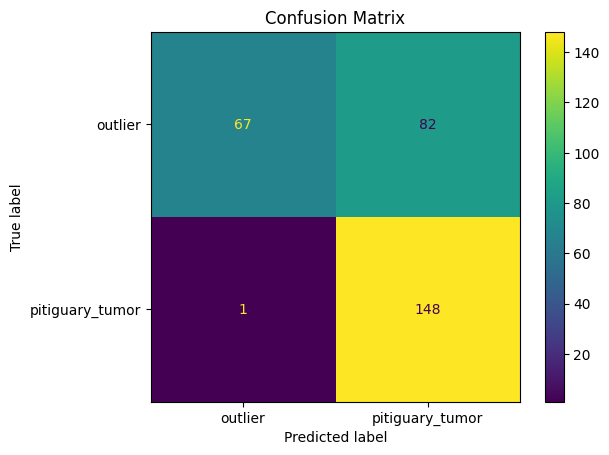












For this thereshold value 0.025 the confusion matrix is 




                 precision    recall  f1-score   support

        outlier       0.98      0.38      0.54       149
pitiguary_tumor       0.61      0.99      0.76       149

       accuracy                           0.68       298
      macro avg       0.80      0.68      0.65       298
   weighted avg       0.80      0.68      0.65       298









<Figure size 800x600 with 0 Axes>

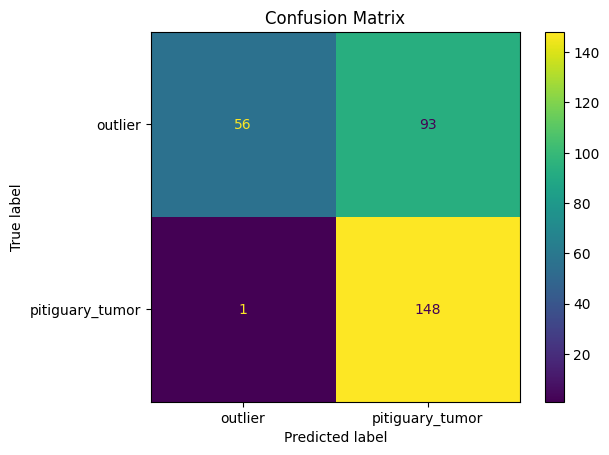

In [ ]:
# Range of thereshokds
thresholds = np.linspace(0.010, 0.025, 10)



print()

# Iteration on theresholds
for threshold in thresholds:

    print("For this thereshold value",threshold, "the confusion matrix is ")
    print("\n"*3)
    preds_1 = []
    preds_2 = []

    # Iteration_tot_validation_notumor
    for error in mse_tot_validation_pitiguary_tumor:
        if error < threshold:
            pred = "pitiguary_tumor"
        else:
            pred = "outlier"
        preds_1.append(pred)

    # Iteration on  mse_simulation_validation_notumor
    for error in mse_simulation_validation_pitiguary_tumor:
        if error < threshold:
            pred = "pitiguary_tumor"
        else:
            pred = "outlier"
        preds_2.append(pred)

    # Unione delle predizioni
    y_pred_validation = preds_1 + preds_2

    # Evaluation of metric
    evaluate_metrics(y_pred_validation, y_validation)

    print("\n"*10)

selected thereshold = 0.013

##### Test the complete classifier

In [ ]:
mse_simulation_test_pitiguary_tumor = []

for i  in range(len(X_test_outlier_pitiguary_tumor)):


  print(i)
  observation = X_test_outlier_pitiguary_tumor[i]
  processed_sample = observation.reshape(1,224,224,3)
  pred = autoencoder.predict(processed_sample)
  mse = mean_squared_error(pred.flatten(), observation.flatten())
  mse_simulation_test_pitiguary_tumor.append(mse)



mse_tot_test_pitiguary_tumor = []

for i in range(len(X_test_pitiguary_tumor)):
   print(i)
   real = X_test_pitiguary_tumor[i]
   preprocessed_real = real.reshape(1,224,224,3)
   pred = autoencoder.predict(preprocessed_real)
   mse = mean_squared_error(pred.flatten(), real.flatten())
   mse_tot_test_pitiguary_tumor.append(mse)


0
1/1 [==============================] - 0s 34ms/step
1
1/1 [==============================] - 0s 33ms/step
2
1/1 [==============================] - 0s 30ms/step
3
1/1 [==============================] - 0s 36ms/step
4
1/1 [==============================] - 0s 42ms/step
5
1/1 [==============================] - 0s 75ms/step
6
1/1 [==============================] - 0s 89ms/step
7
1/1 [==============================] - 0s 234ms/step
8
1/1 [==============================] - 0s 89ms/step
9
1/1 [==============================] - 0s 148ms/step
10
1/1 [==============================] - 0s 247ms/step
11
1/1 [==============================] - 0s 90ms/step
12
1/1 [==============================] - 0s 153ms/step
13
1/1 [==============================] - 0s 165ms/step
14
1/1 [==============================] - 0s 151ms/step
15
1/1 [==============================] - 0s 119ms/step
16
1/1 [==============================] - 0s 71ms/step
17
1/1 [==============================] - 0s 104ms/step
18
1/1 [====

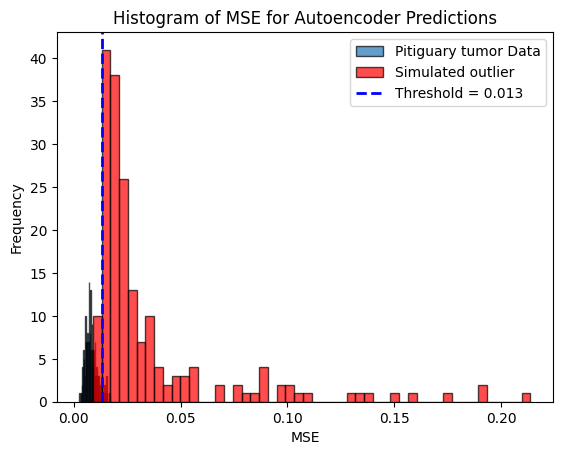

In [ ]:
# Istogramma 1 (mse_tot_test)
plt.hist(mse_tot_test_pitiguary_tumor, bins=50, edgecolor='k', alpha=0.7, label='Pitiguary tumor Data')

# Istogramma 2 (mse_simulation)
plt.hist(mse_simulation_test_pitiguary_tumor, bins=50, edgecolor='k', color='red', alpha=0.7, label='Simulated outlier ')

# Etichette e titolo
plt.xlabel('MSE')
plt.ylabel('Frequency')
plt.title('Histogram of MSE for Autoencoder Predictions')


threshold = 0.013
plt.axvline(threshold, color='blue', linestyle='--', linewidth=2, label=f'Threshold = {threshold}')


# Mostra la legenda
plt.legend()

# Mostra il plot
plt.show()

In [ ]:
## ground_truth
list1 = ["pitiguary_tumor" for _ in range(len(mse_tot_test_pitiguary_tumor))]
list2 = ["outlier" for _ in range(len(mse_simulation_test_pitiguary_tumor))]

y_test = list1 + list2

                 precision    recall  f1-score   support

        outlier       0.93      0.95      0.94       186
pitiguary_tumor       0.95      0.92      0.93       186

       accuracy                           0.94       372
      macro avg       0.94      0.94      0.94       372
   weighted avg       0.94      0.94      0.94       372









<Figure size 800x600 with 0 Axes>

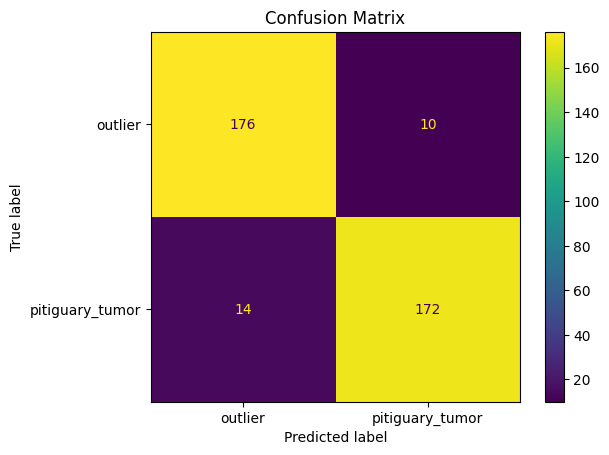

In [ ]:
preds_1 = []
preds_2 = []

# Iteration_tot_validation_pitiguary_tumor
for error in mse_tot_test_pitiguary_tumor:
    if error < threshold:
        pred = "pitiguary_tumor"
    else:
        pred = "outlier"
    preds_1.append(pred)

# Iteration on  mse_simulation_validation_pitiguary_tumor
for error in mse_simulation_test_pitiguary_tumor:
    if error < threshold:
        pred = "pitiguary_tumor"
    else:
        pred = "outlier"
    preds_2.append(pred)

# Unione delle predizioni
y_pred_test = preds_1 + preds_2

# Evaluation of metric
evaluate_metrics(y_pred_test, y_test)

#####Showing the original image and reconstructed image

####### on the trained class

1/1 [==============================] - 0s 27ms/step


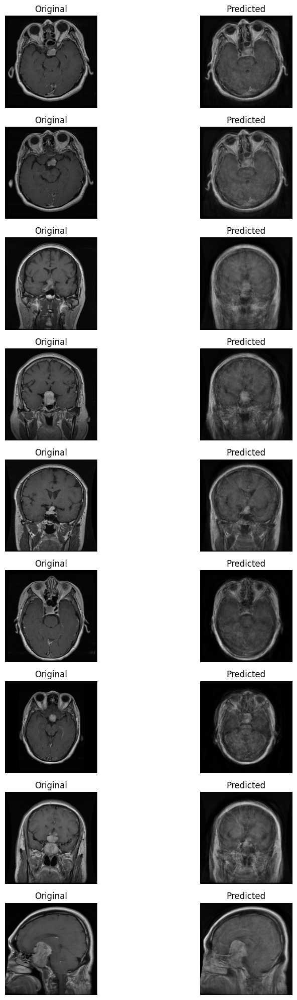

In [ ]:
plt.figure(figsize=(10, 20))

# Displaying 9 images in a 2x9 grid (2 columns, 9 rows)
for i in range(9):
    # Original image
    plt.subplot(9, 2, 2 * i + 1)
    real = X_test_pitiguary_tumor[i].astype(np.float32)
    plt.imshow(real)
    plt.title('Original')
    plt.axis('off')

    # Predicted image
    plt.subplot(9, 2, 2 * i + 2)
    z = real.reshape(1, 224, 224, 3)
    k = autoencoder.predict(z)
    k_new = k[0, :, :, :]
    plt.imshow(k_new)
    plt.title('Predicted')
    plt.axis('off')

plt.tight_layout()
plt.show()

#######on the outlier class

1/1 [==============================] - 0s 29ms/step


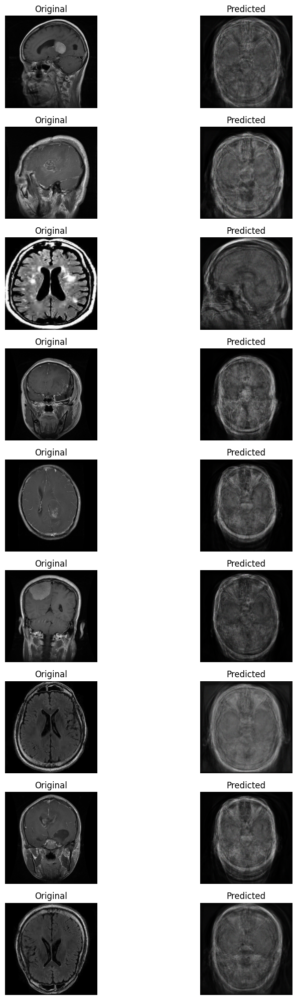

In [ ]:
plt.figure(figsize=(10, 20))

# Displaying 9 images in a 2x9 grid (2 columns, 9 rows)
for i in range(9):
    # Original image
    plt.subplot(9, 2, 2 * i + 1)
    real = X_test_outlier_pitiguary_tumor[i].astype(np.float32)
    plt.imshow(real)
    plt.title('Original')
    plt.axis('off')

    # Predicted image
    plt.subplot(9, 2, 2 * i + 2)
    z = real.reshape(1, 224, 224, 3)
    k = autoencoder.predict(z)
    k_new = k[0, :, :, :]
    plt.imshow(k_new)
    plt.title('Predicted')
    plt.axis('off')

plt.tight_layout()
plt.show()